# <font color="#114b98">Classez des images à l'aide d'algorithmes de Deep Learning</font>

## <font color="#114b98">Notebook de test de différents modèles</font>

Vous êtes bénévole pour l'association de protection des animaux de votre quartier. C'est d'ailleurs ainsi que vous avez trouvé votre compagnon idéal, Snooky. Vous vous demandez donc ce que vous pouvez faire en retour pour aider l'association.

Vous apprenez, en discutant avec un bénévole, que leur base de données de pensionnaires commence à s'agrandir et qu'ils n'ont pas toujours le temps de référencer les images des animaux qu'ils ont accumulées depuis plusieurs années. **Ils aimeraient donc obtenir un algorithme capable de classer les images en fonction de la race du chien présent sur l'image**.

Les bénévoles de l'association n'ont pas eu le temps de réunir les différentes images des pensionnaires dispersées sur leurs disques durs. Pas de problème, vous entraînerez votre algorithme en utilisant le **Stanford Dogs Dataset** : http://vision.stanford.edu/aditya86/ImageNetDogs/

**Objectifs** : Réaliser un algorithme de détection de la race du chien sur une photo

**Livrable** : Un notebook Python

## <font color="#114b98">Sommaire</font>
[1. Chargement du jeu de données](#section_1)

[2. Modèle de base](#section_2)

[3. Preprocessing des images](#section_3)

[4. Modèles avec CNN : Convolutional Neural Network](#section_4)

[5. Modèles avec Transfer Learning](#section_5)

[6. InceptionV3 sur 10 races](#section_6)

[7. InceptionV3 sur 120 races](#section_7)

## <font color="#114b98" id="section_1">1. Chargement du jeu de données</font>

In [1]:
import os
import sys
import torch
import random
import sklearn
import warnings
import itertools
import visualkeras
%matplotlib inline
import numpy as np
import seaborn as sns
from PIL import Image
import multiprocessing
import tensorflow as tf
from PIL import ImageFont
from tabulate import tabulate
# from datetime import datetime
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
import matplotlib.ticker as ticker
from collections import defaultdict
import matplotlib.colors as mcolors
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix
from tensorflow.keras.regularizers import l1, l2
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, Input, Add
from tensorflow.keras.layers import RandomTranslation, RandomContrast, RandomCrop
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.layers import GlobalAveragePooling2D, MaxPooling2D, ZeroPadding2D, BatchNormalization

In [2]:
print("System Version: ", sys.version)
print("Scikit-learn Version: ", sklearn.__version__)
print("Tensorflow Version: ", tf.__version__)
print("Keras Version: ", tf.keras.__version__)
print("PyTorch Version: ", torch.__version__)
print("Num CPUs Available: ", multiprocessing.cpu_count())
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("Tensorflow build with CUDA:", tf.test.is_built_with_cuda())
print("Current working directory:", os.getcwd())

System Version:  3.10.9 | packaged by conda-forge | (main, Feb  2 2023, 20:14:58) [MSC v.1929 64 bit (AMD64)]
Scikit-learn Version:  1.2.1
Tensorflow Version:  2.8.3
Keras Version:  2.8.0
PyTorch Version:  1.13.1
Num CPUs Available:  16
Num GPUs Available:  1
Tensorflow build with CUDA: True
Current working directory: N:\5 - WORK\2 - Jupyter


In [8]:
plt.style.use('seaborn')
font = ImageFont.truetype("arial.ttf", 20) 
palette = sns.color_palette("Set2", n_colors=10)
colors = [mcolors.to_hex(mcolors.to_rgba(color)) for color in palette]
color_map = defaultdict(dict)
color_map[ZeroPadding2D]['fill'] = colors[0]
color_map[Rescaling]['fill'] = colors[1]
color_map[Dropout]['fill'] = colors[2]
color_map[MaxPooling2D]['fill'] = colors[3]
color_map[Conv2D]['fill'] = colors[4]
color_map[Dense]['fill'] = colors[5]
color_map[Flatten]['fill'] = colors[6]
color_map[BatchNormalization]['fill'] = colors[7]
color_map[GlobalAveragePooling2D]['fill'] = colors[8]
color_map[Sequential]['fill'] = colors[9]

In [3]:
# %load_ext pycodestyle_magic
# %pycodestyle_on

In [3]:
main_path = 'N:/5 - WORK/1 - Projets/Projet 6/'
ressources_path = main_path + 'ressources/'
data_dir = ressources_path + 'tenbreeds/'


img_size = (224, 224)
input_shape=img_size+(3,)
batch_size = 32

# Définition de dictionnaires des résultats
models = dict()
pretrained_models = dict()

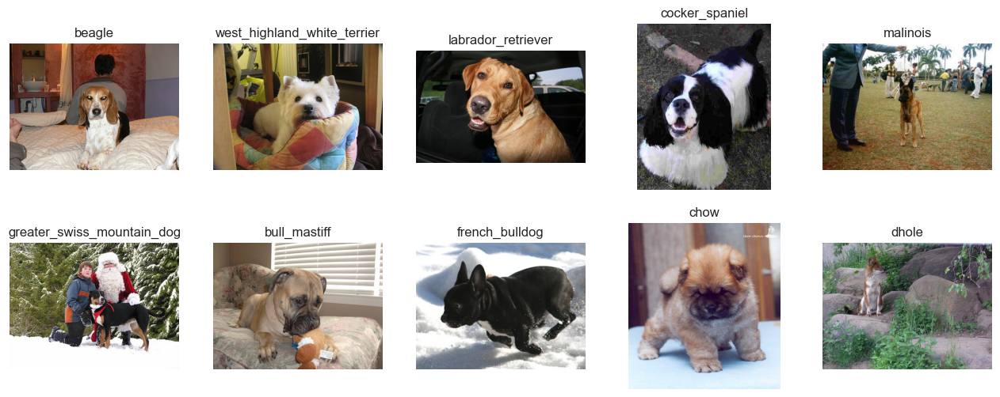

In [6]:
# Présentation des 10 races étudiées
images, races = [], []
plt.figure(figsize=(16,6))
i = 1
for sub_dir in os.listdir(data_dir):
    sub_dir_images = os.listdir(data_dir + sub_dir)
    race = sub_dir.split('-')[1]
    if sub_dir_images:
        sub_dir_image = random.choice(sub_dir_images)
        image = os.path.join(data_dir, sub_dir, sub_dir_image)
        images.append(image)
        races.append(race)
        img = Image.open(image) 
        plt.subplot(2, 5, i)
        plt.axis('off')
        plt.title(race.lower())
        plt.imshow(img)
        i = i + 1
plt.show()

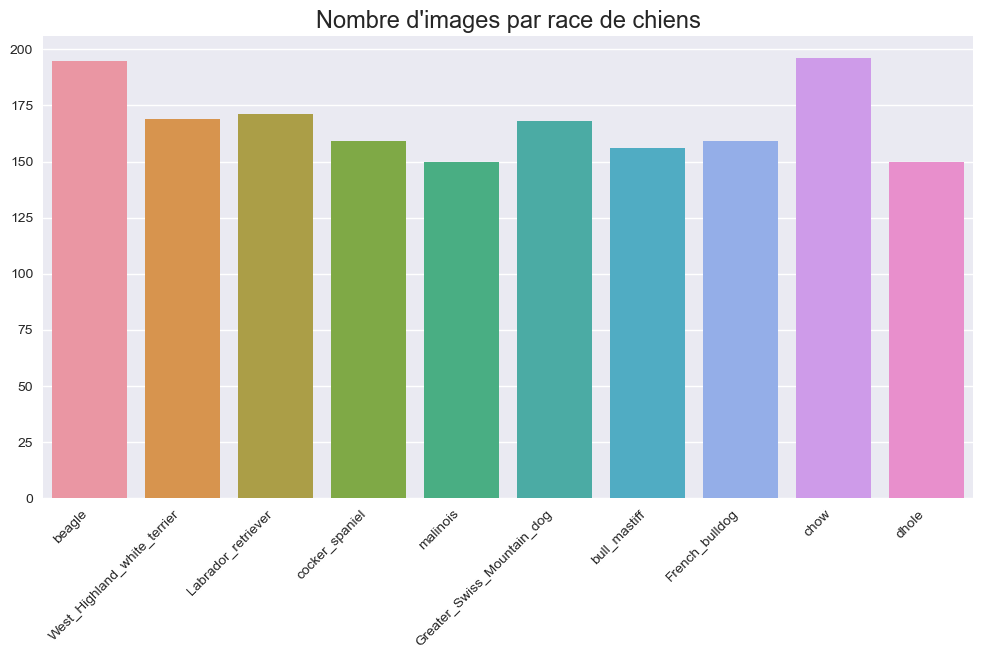

In [7]:
race_counts = {}
for sub_dir in os.listdir(data_dir):
    sub_dir_images = os.listdir(os.path.join(data_dir, sub_dir))
    race = sub_dir.split('-')[1]
    race_counts[race] = len(sub_dir_images)

plt.figure(figsize=(12, 6))
sns.barplot(x=list(race_counts.keys()), y=list(race_counts.values()))
plt.xticks(rotation=45, ha='right')
plt.title("Nombre d'images par race de chiens", size=17)
plt.show()

In [ ]:
# Création d'une partition de 80% des images pour l'entraînement
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset='training',
  seed=420,
  image_size=img_size,
  batch_size=batch_size,
  label_mode='categorical')

# Création d'une partition temporaire de 20% des images
temp_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset='validation',
  seed=420,
  image_size=img_size,
  batch_size=batch_size,
  label_mode='cataegorical')

# Séparation en deux partitions égales (10%) de la partition temporaire pour la validation et les tests
val_ds = temp_ds.take(len(temp_ds)//2)
test_ds = temp_ds.skip(len(temp_ds)//2)

# Nombre de classes possible de classification
num_classes = len(train_ds.class_names) 

## <font color="#114b98" id="section_2">2. Modèle de base</font>

Pour construire une couche de convolution (Conv2D), nous devons préciser :
- filters : le nombre de filtres utilisés,
- kernel_size : leurs tailles,
- strides : le pas,
- padding : le zero-padding.

In [33]:
# Definition de l'architecture du modèle
model = Sequential([
  Rescaling(1./255, input_shape=input_shape),  
  Conv2D(32, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Conv2D(64, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Conv2D(128, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Flatten(),
  Dense(num_classes, activation='softmax')
])

# Compilation du modèle
model.compile(
  optimizer='adam',
  loss='categorical_crossentropy',
  metrics=['categorical_accuracy']
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Résumé du modèle
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d_94 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_95 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_96 (Conv2D)          (None, 52, 52, 128)       7

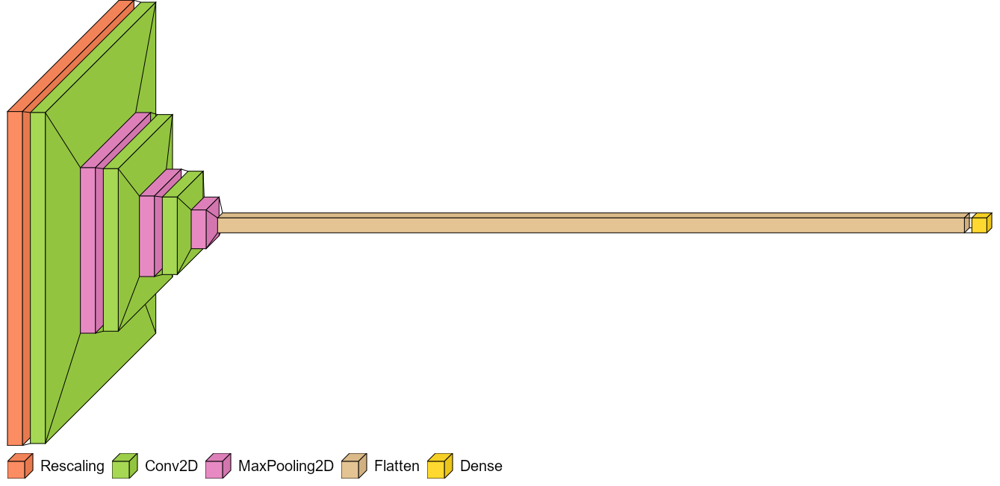

In [10]:
visualkeras.layered_view(model, legend=True,  scale_xy=2, font=font, max_z=1000, color_map=color_map)

In [11]:
# Entraînement du modèle
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=1,
  callbacks=[early_stopping]
)

Epoch 1/15
42/42 [==============================] - 5s 56ms/step - loss: 2.3979 - categorical_accuracy: 0.1494 - val_loss: 2.2597 - val_categorical_accuracy: 0.1562
Epoch 2/15
42/42 [==============================] - 2s 45ms/step - loss: 2.1142 - categorical_accuracy: 0.2532 - val_loss: 2.1047 - val_categorical_accuracy: 0.2250
Epoch 3/15
42/42 [==============================] - 2s 45ms/step - loss: 1.6308 - categorical_accuracy: 0.4742 - val_loss: 2.2903 - val_categorical_accuracy: 0.2562
Epoch 4/15
42/42 [==============================] - 2s 45ms/step - loss: 0.9836 - categorical_accuracy: 0.6833 - val_loss: 2.6911 - val_categorical_accuracy: 0.2688
Epoch 5/15
42/42 [==============================] - 2s 45ms/step - loss: 0.4770 - categorical_accuracy: 0.8596 - val_loss: 3.5624 - val_categorical_accuracy: 0.3000
Epoch 6/15
42/42 [==============================] - 2s 45ms/step - loss: 0.1727 - categorical_accuracy: 0.9552 - val_loss: 4.7536 - val_categorical_accuracy: 0.2562
Epoch 7/15

In [5]:
# Définition de la fonction permettant de représenter graphiquement l'évolution du modèle lors de l'entraînement
def plot_epochs(history):
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    
    ax[0].plot(history.history['categorical_accuracy'])
    ax[0].plot(history.history['val_categorical_accuracy'])
    ax[0].set_title('Model categorical_accuracy', size=16)
    ax[0].set_ylabel('Categorical Accuracy')
    ax[0].legend(['Train', 'Validation'], loc='upper left')
    
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model loss', size=16)
    ax[1].set_ylabel('Loss')    
    ax[1].legend(['Train', 'Validation'], loc='lower left')

    for i in range(len(ax)):   
        ax[i].set_xlabel('Epoch')
        ax[i].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    plt.show()

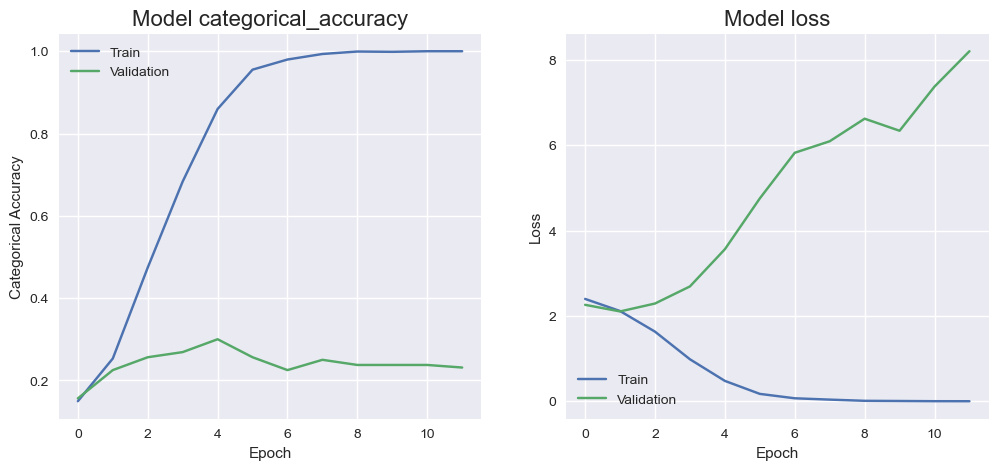

In [13]:
plot_epochs(history)

In [14]:
# Calcul de l'exactitude (accuracy) du modèle
loss, accuracy = model.evaluate(test_ds)
print(f'Test accuracy: {accuracy}')
models['Baseline'] = accuracy

6/6 [==============================] - 0s 41ms/step - loss: 2.1147 - categorical_accuracy: 0.2414
Test accuracy: 0.24137930572032928


## <font color="#114b98" id="section_3">3. Preprocessing des images</font>

### Redimensionnement et normalisation des images

In [15]:
image_paths = images[0:5]
label_paths = races[0:5]

In [6]:
def preprocess_image(image, label):
    """
    La fonction preprocess_image prend une image en entrée 
    et la redimensionne à la taille cible spécifiée. Ensuite, 
    elle convertit les valeurs de pixels en flottants et 
    normalise les valeurs pour qu'elles soient dans la plage [0,1].
    """
    image = tf.image.resize(image, img_size)
    image = tf.cast(image, tf.float32) / 255.0
 
    return image, label

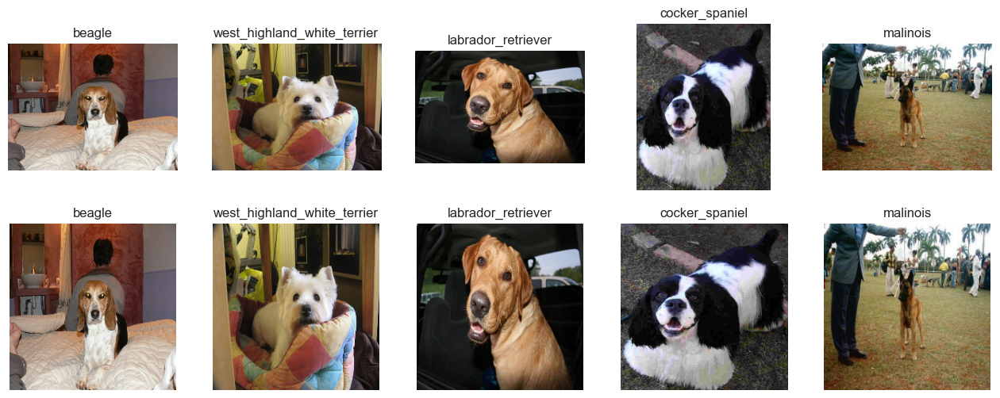

In [17]:
plt.figure(figsize=(16, 6))

for i, (image, race) in enumerate(zip(image_paths, label_paths)):
    if i >= 5:
        break
    img = Image.open(image)
    plt.subplot(2, 5, i + 1)
    plt.axis('off')
    plt.title(race.lower())
    plt.imshow(img)

for i, (image_path, race) in enumerate(zip(image_paths, label_paths)):
    if i >= 5:
        break
    img = Image.open(image_path)
    img = np.array(img)
    img_resized, _ = preprocess_image(img, race)
    img = tf.keras.preprocessing.image.array_to_img(img_resized)
    plt.subplot(2, 5, 5 + i + 1)
    plt.title(race.lower())
    plt.imshow(img)
    plt.axis('off')

plt.show()

### Data Augmentation

Cette technique permet d'élargir la diversité du jeu de données.

In [7]:
data_augmentation = Sequential(
    [
        RandomFlip("horizontal"),
        RandomRotation(0.1),
        RandomZoom(0.1),
        RandomContrast(0.1),
        RandomCrop(img_size[0], img_size[1]),
        RandomTranslation(height_factor=0.1, width_factor=0.1),
    ]
)

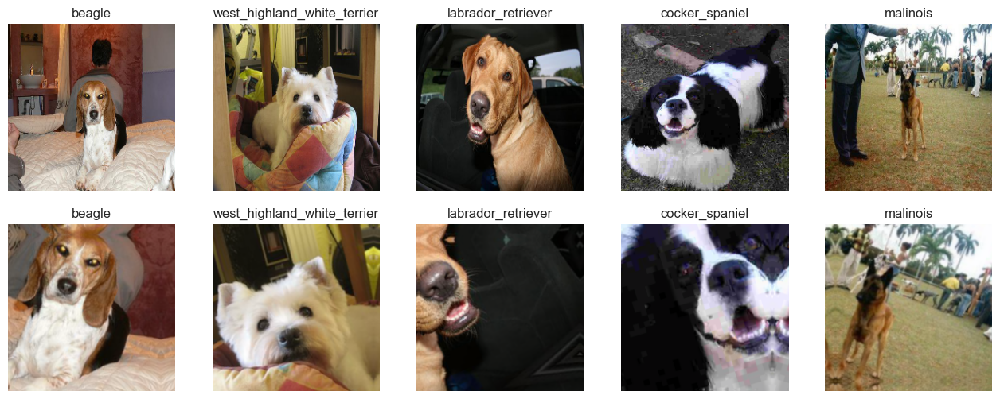

In [19]:
plt.figure(figsize=(16, 6))

for i, (image_path, race) in enumerate(zip(image_paths, label_paths)):
    if i >= 5:
        break
    img = Image.open(image_path)
    img = np.array(img)
    img_resized, _ = preprocess_image(img, race)
    img = tf.keras.preprocessing.image.array_to_img(img_resized)
    plt.subplot(2, 5, i + 1)
    plt.title(race.lower())
    plt.imshow(img)
    plt.axis('off')

for i, (image_path, race) in enumerate(zip(image_paths, label_paths)):
    if i >= 10:
        break
    img = Image.open(image_path)
    img = np.array(img)
    img_augmented = data_augmentation(np.array([img]))[0]
    img_augmented = tf.keras.preprocessing.image.array_to_img(img_augmented)
    plt.subplot(2, 5, 5 + i + 1)
    plt.title(f'{race.lower()}')
    plt.imshow(img_augmented)
    plt.axis('off')

plt.show()

In [10]:
train_ds_aug = train_ds.map(preprocess_image).map(lambda x, y: (data_augmentation(x), y))
val_ds_aug = val_ds.map(preprocess_image)
test_ds_aug = test_ds.map(preprocess_image)

In [21]:
model = Sequential([
  Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
  MaxPooling2D(pool_size=(2, 2)),
  Conv2D(64, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Conv2D(128, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Flatten(),
  Dense(num_classes, activation='softmax')
])

model.compile(
  optimizer=Adam(lr=0.001),
  loss='categorical_crossentropy',
  metrics=['categorical_accuracy']
)

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 26, 26, 128)     

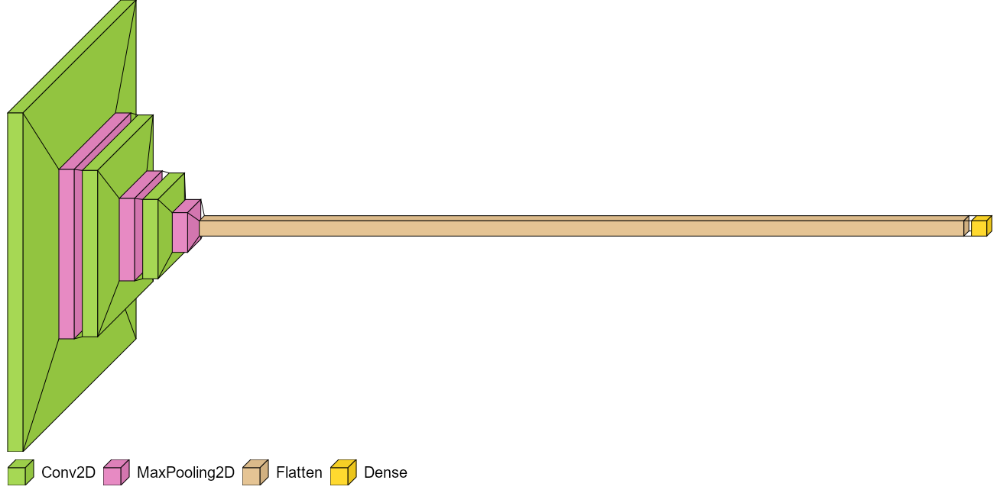

In [22]:
visualkeras.layered_view(model, legend=True,  scale_xy=2, font=font, max_z=1000, color_map=color_map)

In [23]:
epochs = 15
history = model.fit(
  train_ds_aug,
  validation_data=val_ds_aug,
  epochs=epochs,
  verbose=1,
  callbacks=[early_stopping]
)

Epoch 1/15
42/42 [==============================] - 16s 380ms/step - loss: 2.3032 - categorical_accuracy: 0.1187 - val_loss: 2.2022 - val_categorical_accuracy: 0.1625
Epoch 2/15
42/42 [==============================] - 17s 392ms/step - loss: 2.1663 - categorical_accuracy: 0.2158 - val_loss: 2.1635 - val_categorical_accuracy: 0.2625
Epoch 3/15
42/42 [==============================] - 16s 387ms/step - loss: 2.0350 - categorical_accuracy: 0.2741 - val_loss: 2.1187 - val_categorical_accuracy: 0.2750
Epoch 4/15
42/42 [==============================] - 16s 388ms/step - loss: 1.9580 - categorical_accuracy: 0.3144 - val_loss: 2.0638 - val_categorical_accuracy: 0.2750
Epoch 5/15
42/42 [==============================] - 16s 386ms/step - loss: 1.8905 - categorical_accuracy: 0.3465 - val_loss: 2.0146 - val_categorical_accuracy: 0.3125
Epoch 6/15
42/42 [==============================] - 17s 390ms/step - loss: 1.8638 - categorical_accuracy: 0.3555 - val_loss: 1.9569 - val_categorical_accuracy: 0.318

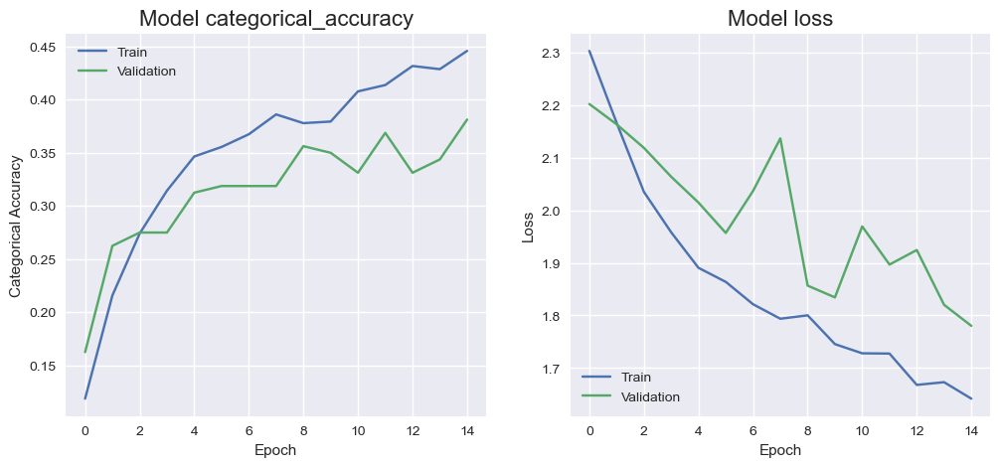

In [24]:
plot_epochs(history)

In [25]:
loss, accuracy = model.evaluate(test_ds_aug)
print(f'Test accuracy: {accuracy}')
models['Baseline \n+ Data Augmentation'] = accuracy

6/6 [==============================] - 0s 27ms/step - loss: 1.7634 - categorical_accuracy: 0.3851
Test accuracy: 0.3850574791431427


### Conversion RGB en niveaux de gris

In [26]:
def preprocess_image_bw(image, label):
    """
    La fonction preprocess_image_bw prend une image en entrée et la convertit en niveaux de gris.
    L'image est redimensionnée à la taille cible et normalisée.
    L'image est ensuite passée dans la fonction adjust_contrast.
    """
    image = np.array(image)
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.resize(image, img_size)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.adjust_contrast(image, 1.0)
    
    return image, label

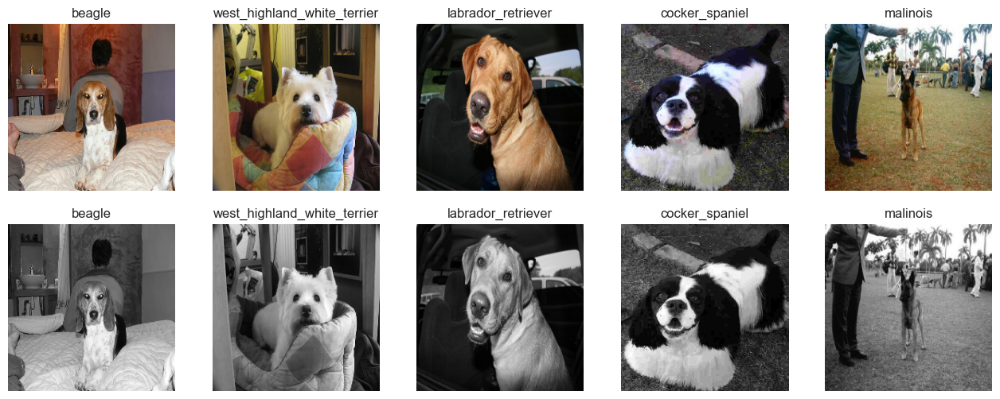

In [27]:
plt.figure(figsize=(16, 6))

for i, (image_path, race) in enumerate(zip(image_paths, label_paths)):
    if i >= 5:
        break
    img = Image.open(image_path)
    img = np.array(img)
    img_resized, _ = preprocess_image(img, race)
    img = tf.keras.preprocessing.image.array_to_img(img_resized)
    plt.subplot(2, 5, i + 1)
    plt.title(race.lower())
    plt.imshow(img)
    plt.axis('off')
    
for i, (image_path, race) in enumerate(zip(image_paths, label_paths)):
    if i >= 5:
        break
    img = Image.open(image_path)
    img_resized, _ = preprocess_image_bw(img, race)
    img_resized = np.squeeze(img_resized, axis=-1)  # remove channel dimension
    plt.subplot(2, 5, 5 + i + 1)
    plt.title(race.lower())
    plt.imshow(img_resized, cmap='gray')
    plt.axis('off')

plt.show()

In [28]:
def preprocess_image_bw_tf(image, label):
    """
    La fonction preprocess_image_bw_tf prend une image en entrée et la convertit en niveaux de gris.
    L'image est redimensionnée à la taille cible et normalisée.
    L'image est ensuite passée dans la fonction adjust_contrast.
    """
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.resize(image, img_size)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.adjust_contrast(image, 1.0)
    
    return image, label

In [29]:
train_ds_bw = train_ds.map(preprocess_image_bw_tf).map(lambda x, y: (data_augmentation(x), y))
val_ds_bw = val_ds.map(preprocess_image_bw_tf)
test_ds_bw = test_ds.map(preprocess_image_bw_tf)

In [30]:
input_shape_gs = (img_size[0], img_size[1], 1)

In [31]:
model = Sequential([
  Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape_gs),
  MaxPooling2D(pool_size=(2, 2)),
  Conv2D(64, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Conv2D(128, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Flatten(),
  Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(
  optimizer='adam',
  loss='categorical_crossentropy',
  metrics=['categorical_accuracy']
)

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 222, 222, 32)      320       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 26, 26, 128)     

In [32]:
epochs = 15
history = model.fit(
  train_ds_bw,
  validation_data=val_ds_bw,
  epochs=epochs,
  verbose=1,
  callbacks=[early_stopping]
)

Epoch 1/15
42/42 [==============================] - 8s 176ms/step - loss: 2.3063 - categorical_accuracy: 0.1135 - val_loss: 2.2477 - val_categorical_accuracy: 0.1562
Epoch 2/15
42/42 [==============================] - 8s 183ms/step - loss: 2.2377 - categorical_accuracy: 0.1494 - val_loss: 2.2620 - val_categorical_accuracy: 0.1063
Epoch 3/15
42/42 [==============================] - 9s 203ms/step - loss: 2.2127 - categorical_accuracy: 0.1725 - val_loss: 2.1705 - val_categorical_accuracy: 0.1625
Epoch 4/15
42/42 [==============================] - 9s 200ms/step - loss: 2.1742 - categorical_accuracy: 0.1957 - val_loss: 2.1459 - val_categorical_accuracy: 0.1500
Epoch 5/15
42/42 [==============================] - 8s 198ms/step - loss: 2.1168 - categorical_accuracy: 0.2308 - val_loss: 2.2119 - val_categorical_accuracy: 0.1875
Epoch 6/15
42/42 [==============================] - 8s 196ms/step - loss: 2.0656 - categorical_accuracy: 0.2457 - val_loss: 2.0698 - val_categorical_accuracy: 0.2562
Epoc

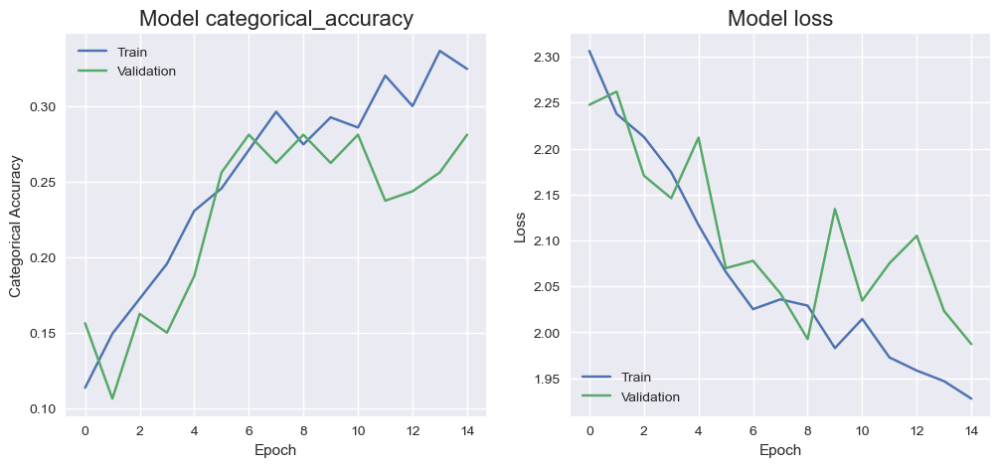

In [33]:
plot_epochs(history)

In [34]:
loss, accuracy = model.evaluate(test_ds_bw)
print(f'Test accuracy: {accuracy}')
models['Baseline \n+ Data Augmentation \n+ GreyScale'] = accuracy

6/6 [==============================] - 0s 33ms/step - loss: 1.9274 - categorical_accuracy: 0.3448
Test accuracy: 0.3448275923728943


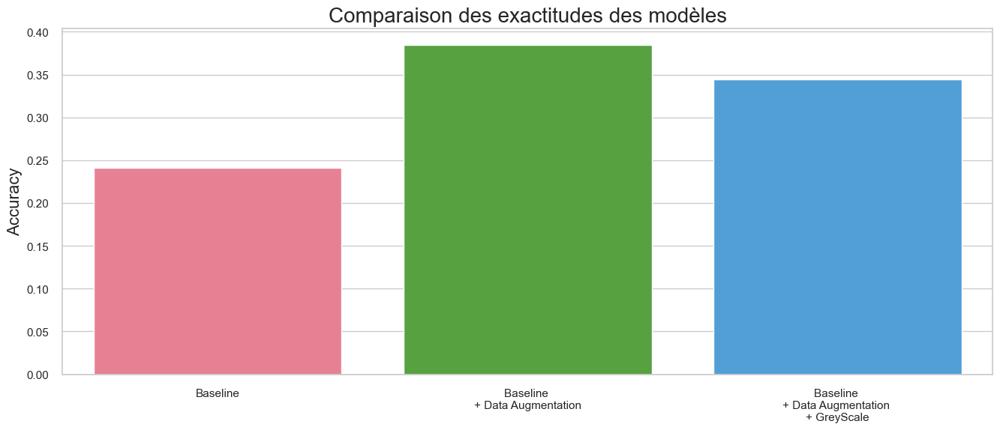

In [35]:
plt.figure(figsize=(16, 6))
sns.set(style='whitegrid')
sns.barplot(x=list(models.keys()), y=list(models.values()), palette='husl')
plt.ylabel('Accuracy', size=16)
plt.title('Comparaison des exactitudes des modèles', size=20)
plt.show()

## <font color="#114b98" id="section_4">4. Modèles avec CNN : Convolutional Neural Network</font>

Nous allons réaliser dans cette partie notre propre réseau en s'inspirant de l'architecture du réseau AlexNet. 

In [10]:
def preprocess_image_with_augmentation(image, label):
    """
    Cette fonction prend une image en entrée et la redimensionne 
    à la taille cible spécifiée. Elle convertit ensuite les valeurs 
    de pixels en flottants et normalise les valeurs pour qu'elles 
    soient dans la plage [0,1]. L'image est ensuite augmentée à 
    l'aide de la fonction data_augmentation, qui applique plusieurs 
    techniques d'augmentation de données, telles que la modification 
    de la luminosité, la modification de la saturation et la rotation 
    de l'image. Enfin, l'image est transformée à l'aide de plusieurs 
    fonctions TensorFlow, pour renforcer la généralisation et prévenir
    l'overfitting.
    """
    image = tf.image.resize(image, img_size)
    image = tf.image.random_brightness(image, 1.0)
    image = tf.image.random_hue(image, 0.1)
    image = tf.image.random_flip_left_right(image) 
    image = tf.image.random_saturation(image, 0.9, 1.1)
    image = tf.cast(image, tf.float32) / 255.0
    return image, label


train_ds_ = train_ds.map(preprocess_image_with_augmentation)
val_ds_ = val_ds.map(preprocess_image)
test_ds_ = test_ds.map(preprocess_image)

In [81]:
def show_data_augmentation(dataset):
    plt.figure(figsize=(12, 7))
    for images, labels in dataset.take(1):
        augmented_images, _ = preprocess_image_with_augmentation(images, labels)
        for i in range(5):
            ax = plt.subplot(3, 5, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.axis("off")
            ax = plt.subplot(3, 5, 5 + i + 1)
            aug_img = augmented_images[i]
            aug_img = tf.cast(aug_img * 255, tf.uint8)
            plt.imshow(aug_img.numpy().astype("uint8"))
            plt.axis("off")
            ax = plt.subplot(3, 5, 10 + i + 1)
            aug_img = preprocess_image_with_augmentation(images[i], labels[i])[0]
            aug_img = tf.cast(aug_img * 255, tf.uint8)
            plt.imshow(aug_img.numpy().astype("uint8"))
            plt.axis("off")
    plt.show()

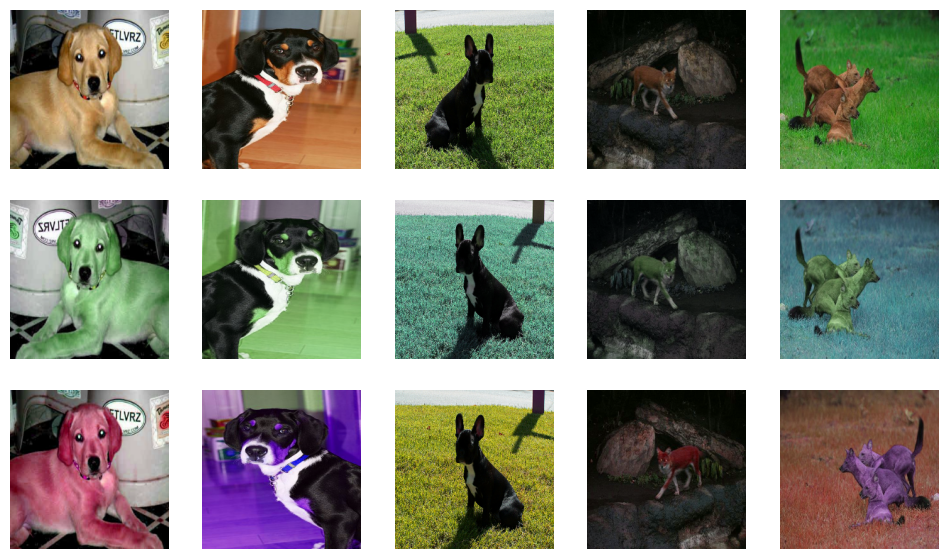

In [82]:
show_data_augmentation(train_ds)

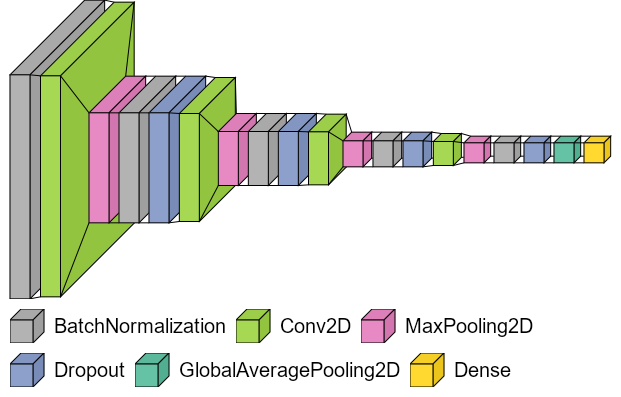

In [9]:
visualkeras.layered_view(model, legend=True,  scale_xy=1, font=font, max_z=20, color_map=color_map)

In [86]:
# Le meilleur modèle que j'ai pu trouver en hyperparamétrant à la main
model = Sequential([
    BatchNormalization(input_shape=input_shape),
    
    Conv2D(filters=16, kernel_size=4, kernel_initializer='he_normal', activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2,2)),
    BatchNormalization(),
    Dropout(0.25),
    
    Conv2D(filters=32, kernel_size=3, kernel_initializer='he_normal', activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2,2)),
    BatchNormalization(),
    Dropout(0.25),
    
    Conv2D(filters=64, kernel_size=2, kernel_initializer='he_normal', activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2,2)),
    BatchNormalization(),
    Dropout(0.25),
    
    Conv2D(filters=128, kernel_size=3, kernel_initializer='he_normal', activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2,2)),
    BatchNormalization(),
    Dropout(0.25),
    
    GlobalAveragePooling2D(),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

epochs = 120
history = model.fit(
    train_ds_,     
    epochs=epochs,
    validation_data=val_ds_,
    callbacks=[early_stopping]
)

Epoch 1/120
42/42 [==============================] - 4s 82ms/step - loss: 6.6180 - categorical_accuracy: 0.1867 - val_loss: 6.1848 - val_categorical_accuracy: 0.0938
Epoch 2/120
42/42 [==============================] - 3s 80ms/step - loss: 5.5562 - categorical_accuracy: 0.2181 - val_loss: 5.3671 - val_categorical_accuracy: 0.1688
Epoch 3/120
42/42 [==============================] - 3s 80ms/step - loss: 4.7563 - categorical_accuracy: 0.2539 - val_loss: 4.8453 - val_categorical_accuracy: 0.1375
Epoch 4/120
42/42 [==============================] - 3s 80ms/step - loss: 4.1667 - categorical_accuracy: 0.2524 - val_loss: 4.6414 - val_categorical_accuracy: 0.1375
Epoch 5/120
42/42 [==============================] - 3s 79ms/step - loss: 3.7287 - categorical_accuracy: 0.2554 - val_loss: 4.5603 - val_categorical_accuracy: 0.1375
Epoch 6/120
42/42 [==============================] - 3s 79ms/step - loss: 3.3795 - categorical_accuracy: 0.2808 - val_loss: 4.2761 - val_categorical_accuracy: 0.1500
Epoc

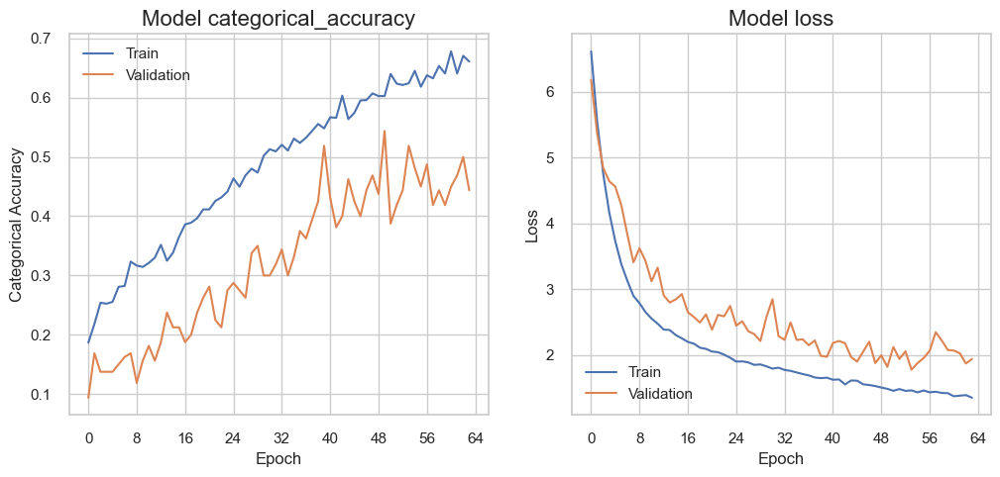

In [87]:
plot_epochs(history)

In [88]:
# Création du model à hyperparamétrer
def build_model(num_filters, k_sizes, k_init, l2_value, pool_sizes, dropout):

    table = [["num_filters", num_filters],
             ["k_sizes", k_sizes],
             ["k_init", k_init],
             ["l2_value", l2_value],
             ["pool_sizes", pool_sizes],
             ["dropout", dropout]]

    print(tabulate(table, headers=["Parameter", "Value"]))
    
    model = Sequential()
    model.add(BatchNormalization(input_shape=input_shape))
    
    for i, (f, k, p) in enumerate(zip(num_filters, k_sizes, pool_sizes)):
        model.add(Conv2D(f, k, kernel_initializer=k_init, activation='relu', kernel_regularizer=l2(l2_value)))
        model.add(MaxPooling2D(pool_size=p))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))
        
    model.add(GlobalAveragePooling2D())
    model.add(Dense(num_classes, activation='softmax'))
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])
    
    return model

In [54]:
# Definition des hyperparamètres à rechercher
param_grid = {
    'num_filters': [[16, 32, 64, 128], [32, 64, 128, 256]], 
    'k_sizes': [[5, 3, 3, 3], [4, 3, 2, 3], [5, 3, 3, 2], [3, 3, 3, 3]],
    'k_init': ['he_normal', 'glorot_uniform', 'random_normal'],
    'l2_value': [0.01, 0.02, 0.03],
    'pool_sizes': [[(2, 2), (2, 2), (2, 2), (2, 2)], [(3, 3), (2, 2), (2, 2), (2, 2)]],
    'dropout': [0.20, 0.25, 0.5, 0.75]
}

# Génération des combinaisons des hyperparamètres
param_combinations = list(itertools.product(*param_grid.values()))
print("Nombre de combinaisons :", len(param_combinations))

Nombre de combinaisons : 576


In [67]:
# Definition des hyperparamètres à rechercher
param_grid = {
    'num_filters': [[16, 32, 64, 128]], 
    'k_sizes': [[5, 3, 3, 3]],
    'k_init': ['he_normal', 'glorot_uniform', 'random_normal'],
    'l2_value': [0.01, 0.02],
    'pool_sizes': [[(3, 3), (2, 2), (2, 2), (2, 2)]],
    'dropout': [0.25]
}

# Génération des combinaisons des hyperparamètres
param_combinations = list(itertools.product(*param_grid.values()))
print("Nombre de combinaisons :", len(param_combinations))

Nombre de combinaisons : 6


In [70]:
# Entraînement du model pour chaque combinaison
best_score = 0
best_params = {}
epochs = 120
for params in param_combinations:
    
    print("**********************************************************************************************")
    print("Training model")
    model = build_model(*params)
    
    history = model.fit(train_ds_,
                        epochs=epochs,
                        validation_data=val_ds_,
                        callbacks=[early_stopping])
    
    score = model.evaluate(val_ds_, verbose=0)[1]
    
    # Sauvegarde du meilleur score et de ses hyperparamètres
    if score > best_score:
        best_score = score
        best_params = params
    
    print("Model Score:", score)
    print("Best Score:", best_score)
    print("**********************************************************************************************")

**********************************************************************************************
Training model
Parameter    Value
-----------  --------------------------------
num_filters  [16, 32, 64, 128]
k_sizes      [5, 3, 3, 3]
k_init       he_normal
l2_value     0.01
pool_sizes   [(3, 3), (2, 2), (2, 2), (2, 2)]
dropout      0.25
Epoch 1/120
42/42 [==============================] - 4s 78ms/step - loss: 6.6334 - categorical_accuracy: 0.1927 - val_loss: 6.3278 - val_categorical_accuracy: 0.1625
Epoch 2/120
42/42 [==============================] - 3s 81ms/step - loss: 5.5992 - categorical_accuracy: 0.2457 - val_loss: 5.7793 - val_categorical_accuracy: 0.1437
Epoch 3/120
42/42 [==============================] - 3s 77ms/step - loss: 4.7983 - categorical_accuracy: 0.2793 - val_loss: 5.4798 - val_categorical_accuracy: 0.1000
Epoch 4/120
42/42 [==============================] - 3s 79ms/step - loss: 4.1832 - categorical_accuracy: 0.2957 - val_loss: 4.8706 - val_categorical_accuracy: 0.1625

42/42 [==============================] - 3s 78ms/step - loss: 1.6940 - categorical_accuracy: 0.5795 - val_loss: 2.1141 - val_categorical_accuracy: 0.3938
Epoch 36/120
42/42 [==============================] - 3s 77ms/step - loss: 1.6890 - categorical_accuracy: 0.5676 - val_loss: 2.6010 - val_categorical_accuracy: 0.2875
Model Score: 0.4437499940395355
Best Score: 0.5874999761581421
**********************************************************************************************
**********************************************************************************************
Training model
Parameter    Value
-----------  --------------------------------
num_filters  [16, 32, 64, 128]
k_sizes      [5, 3, 3, 3]
k_init       glorot_uniform
l2_value     0.01
pool_sizes   [(3, 3), (2, 2), (2, 2), (2, 2)]
dropout      0.25
Epoch 1/120
42/42 [==============================] - 5s 84ms/step - loss: 3.6992 - categorical_accuracy: 0.2308 - val_loss: 3.7297 - val_categorical_accuracy: 0.1063
Epoch 2/120
4

42/42 [==============================] - 3s 78ms/step - loss: 1.7552 - categorical_accuracy: 0.4877 - val_loss: 2.0724 - val_categorical_accuracy: 0.3625
Epoch 24/120
42/42 [==============================] - 3s 78ms/step - loss: 1.7355 - categorical_accuracy: 0.4877 - val_loss: 2.0634 - val_categorical_accuracy: 0.3562
Epoch 25/120
42/42 [==============================] - 3s 79ms/step - loss: 1.7246 - categorical_accuracy: 0.4974 - val_loss: 2.1045 - val_categorical_accuracy: 0.3500
Epoch 26/120
42/42 [==============================] - 3s 79ms/step - loss: 1.6970 - categorical_accuracy: 0.5183 - val_loss: 2.1267 - val_categorical_accuracy: 0.3375
Epoch 27/120
42/42 [==============================] - 3s 78ms/step - loss: 1.6738 - categorical_accuracy: 0.5198 - val_loss: 2.0311 - val_categorical_accuracy: 0.3812
Epoch 28/120
42/42 [==============================] - 3s 76ms/step - loss: 1.6185 - categorical_accuracy: 0.5474 - val_loss: 1.9908 - val_categorical_accuracy: 0.3500
Epoch 29/12

In [71]:
print("Best hyperparameters:", best_params)
print("Best validation accuracy:", round(best_score, 2))

Best hyperparameters: ([16, 32, 64, 128], [5, 3, 3, 3], 'he_normal', 0.01, [(3, 3), (2, 2), (2, 2), (2, 2)], 0.25)
Best validation accuracy: 0.59


In [89]:
# Mettre ici les best_params
best_params = ([16, 32, 64, 128], [5, 3, 3, 3], 'he_normal', 0.01, [(3, 3), (2, 2), (2, 2), (2, 2)], 0.25)

In [90]:
best_model = build_model(*best_params)

Parameter    Value
-----------  --------------------------------
num_filters  [16, 32, 64, 128]
k_sizes      [5, 3, 3, 3]
k_init       he_normal
l2_value     0.01
pool_sizes   [(3, 3), (2, 2), (2, 2), (2, 2)]
dropout      0.25


In [91]:
best_model.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_115 (Ba  (None, 224, 224, 3)      12        
 tchNormalization)                                               
                                                                 
 conv2d_101 (Conv2D)         (None, 220, 220, 16)      1216      
                                                                 
 max_pooling2d_101 (MaxPooli  (None, 73, 73, 16)       0         
 ng2D)                                                           
                                                                 
 batch_normalization_116 (Ba  (None, 73, 73, 16)       64        
 tchNormalization)                                               
                                                                 
 dropout_92 (Dropout)        (None, 73, 73, 16)        0         
                                                     

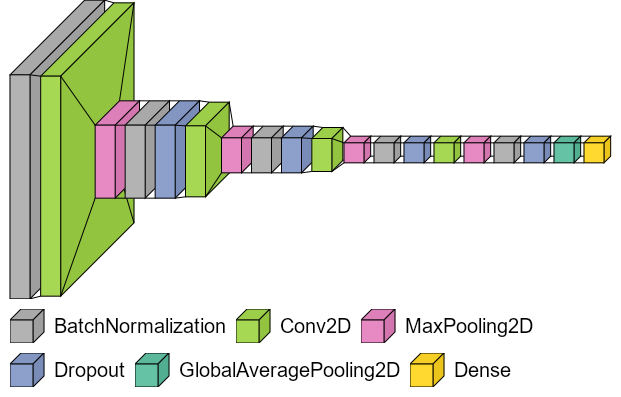

In [92]:
visualkeras.layered_view(best_model, legend=True,  scale_xy=1, font=font, max_z=20, color_map=color_map)

In [93]:
epochs = 120
history = best_model.fit(
    train_ds_,     
    epochs=epochs,
    validation_data=val_ds_
)

Epoch 1/120
42/42 [==============================] - 4s 77ms/step - loss: 6.5895 - categorical_accuracy: 0.2039 - val_loss: 6.2918 - val_categorical_accuracy: 0.1125
Epoch 2/120
42/42 [==============================] - 3s 80ms/step - loss: 5.6018 - categorical_accuracy: 0.2405 - val_loss: 5.4643 - val_categorical_accuracy: 0.2062
Epoch 3/120
42/42 [==============================] - 3s 78ms/step - loss: 4.8352 - categorical_accuracy: 0.2726 - val_loss: 5.1614 - val_categorical_accuracy: 0.1437
Epoch 4/120
42/42 [==============================] - 3s 77ms/step - loss: 4.2415 - categorical_accuracy: 0.2838 - val_loss: 4.7175 - val_categorical_accuracy: 0.1000
Epoch 5/120
42/42 [==============================] - 3s 77ms/step - loss: 3.7828 - categorical_accuracy: 0.3025 - val_loss: 4.4837 - val_categorical_accuracy: 0.1625
Epoch 6/120
42/42 [==============================] - 3s 78ms/step - loss: 3.4183 - categorical_accuracy: 0.3331 - val_loss: 4.1166 - val_categorical_accuracy: 0.1375
Epoc

42/42 [==============================] - 3s 78ms/step - loss: 1.0344 - categorical_accuracy: 0.8350 - val_loss: 1.9307 - val_categorical_accuracy: 0.5750
Epoch 100/120
42/42 [==============================] - 3s 78ms/step - loss: 1.0508 - categorical_accuracy: 0.8290 - val_loss: 1.7903 - val_categorical_accuracy: 0.6125
Epoch 101/120
42/42 [==============================] - 3s 78ms/step - loss: 1.0104 - categorical_accuracy: 0.8447 - val_loss: 1.6324 - val_categorical_accuracy: 0.6062
Epoch 102/120
42/42 [==============================] - 3s 78ms/step - loss: 1.0463 - categorical_accuracy: 0.8275 - val_loss: 1.8432 - val_categorical_accuracy: 0.5750
Epoch 103/120
42/42 [==============================] - 3s 78ms/step - loss: 1.0253 - categorical_accuracy: 0.8379 - val_loss: 1.7203 - val_categorical_accuracy: 0.6187
Epoch 104/120
42/42 [==============================] - 3s 75ms/step - loss: 1.0143 - categorical_accuracy: 0.8417 - val_loss: 1.7087 - val_categorical_accuracy: 0.6313
Epoch 

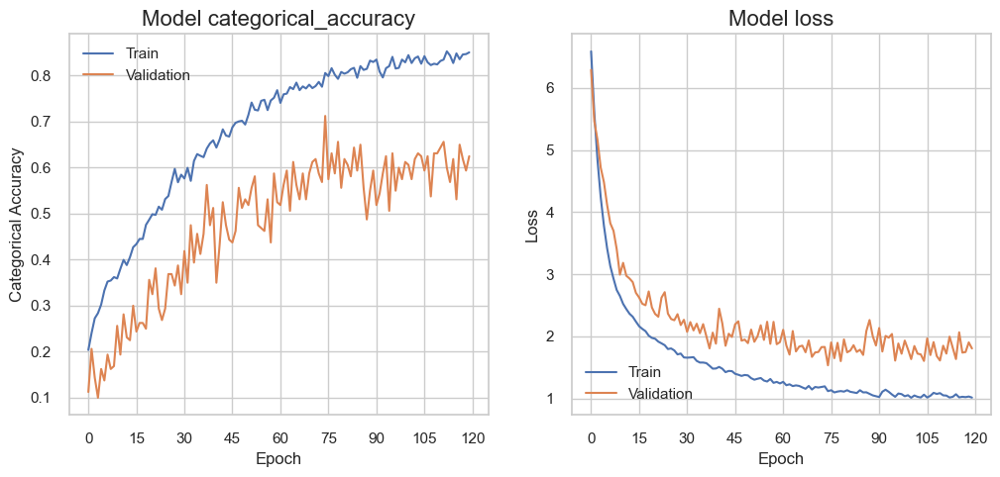

In [94]:
plot_epochs(history)

In [95]:
loss, accuracy = best_model.evaluate(test_ds_)
print(f'Test accuracy: {accuracy}')
models['AlexNet'] = accuracy

6/6 [==============================] - 0s 39ms/step - loss: 1.9154 - categorical_accuracy: 0.6207
Test accuracy: 0.6206896305084229


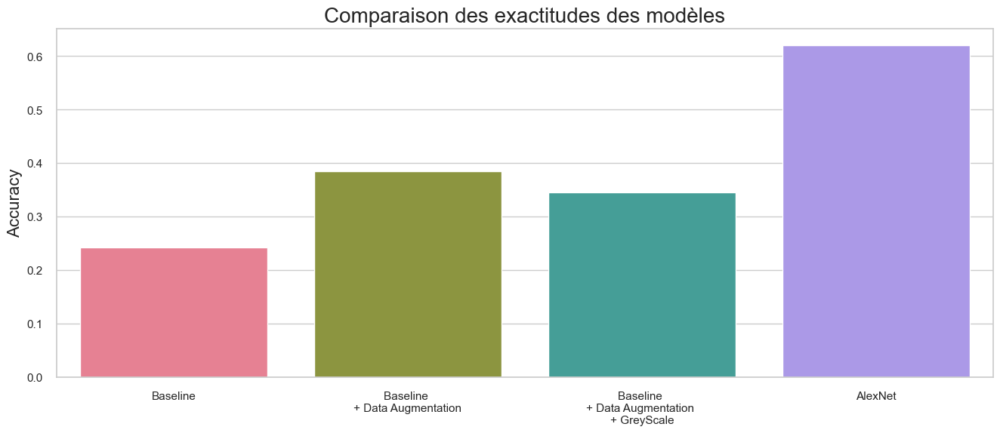

In [96]:
plt.figure(figsize=(16, 6))
sns.set(style='whitegrid')
sns.barplot(x=list(models.keys()), y=list(models.values()), palette='husl')
plt.ylabel('Accuracy', size=16)
plt.title('Comparaison des exactitudes des modèles', size=20)
plt.show()

In [97]:
# Je souhaite maintenant pouvoir observer les cartes de caractéristiques (Feature Maps)

In [98]:
# Créer une liste pour stocker les sorties de chaque couche
layer_outputs = [layer.output for layer in best_model.layers]

# Créer un modèle intermédiaire qui renvoie les sorties de toutes les couches
intermediate_model = Model(inputs=best_model.inputs, outputs=layer_outputs)

# Obtenir les activations pour une image d'exemple
sample_image = train_ds_.take(1).as_numpy_iterator().next()[0][0]
activations = intermediate_model.predict(np.expand_dims(sample_image, axis=0))

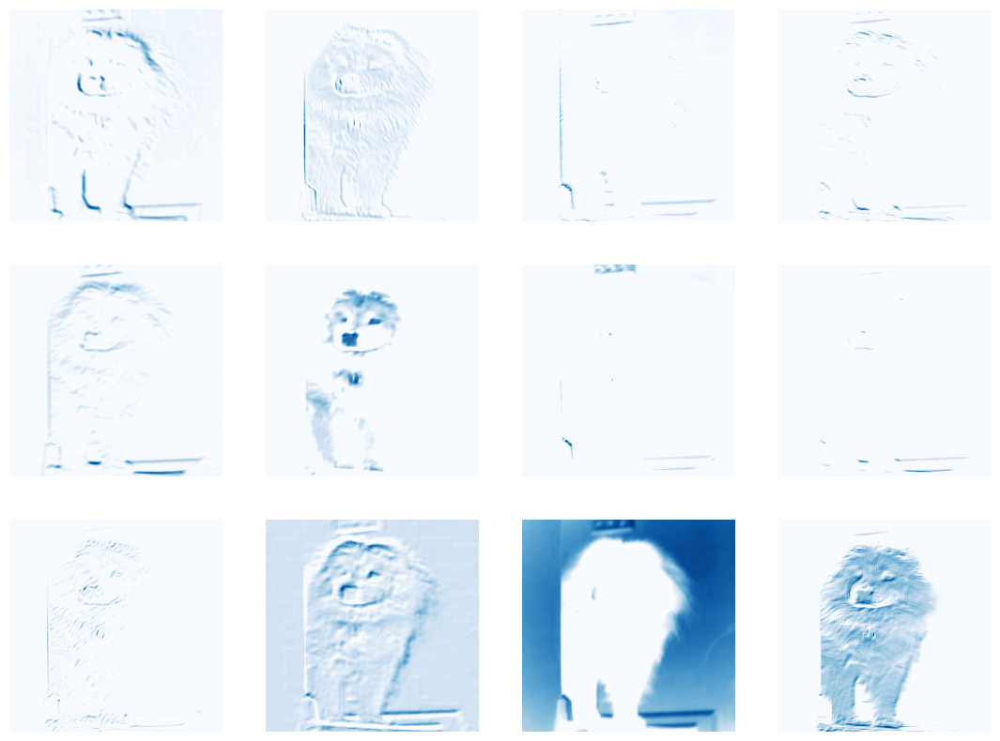

In [99]:
# Définir une fonction pour afficher les activations d'une couche spécifique
def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    activation_index=0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*4.5,col_size*2.5))
    for row in range(0,row_size):
        for col in range(0,col_size):
            ax[row][col].imshow(activation[0, :, :, activation_index], cmap = 'Blues')
            ax[row][col].set_axis_off()
            activation_index += 1

# Appeler la fonction pour afficher les activations de la 2ème couche
display_activation(activations, 4, 3, 1)

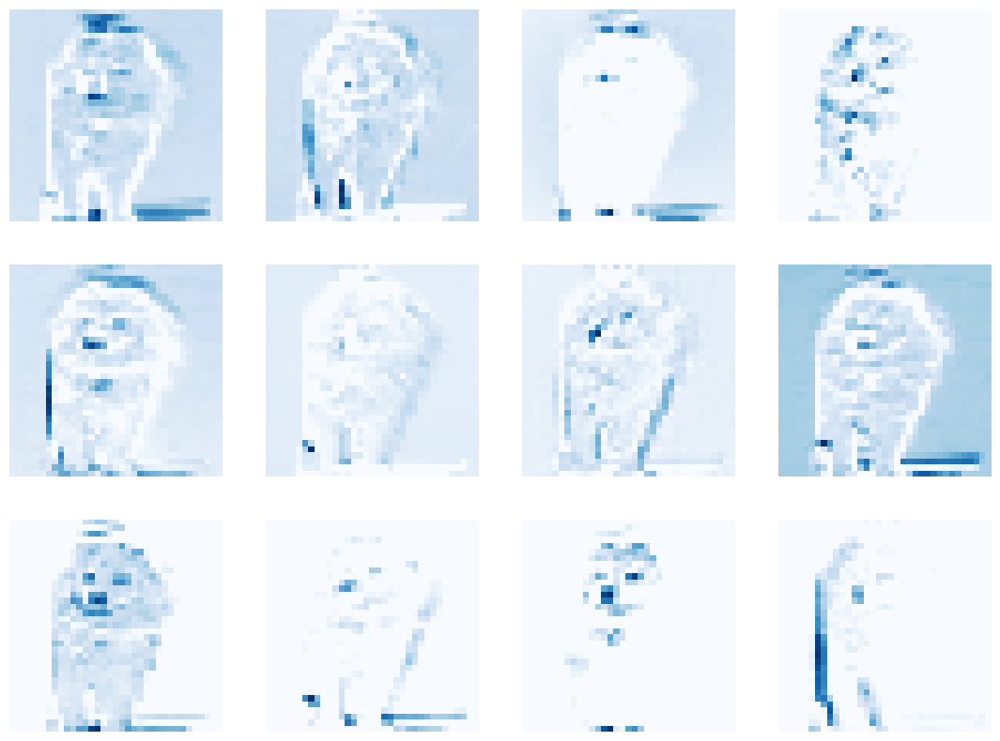

In [100]:
display_activation(activations, 4, 3, 6)

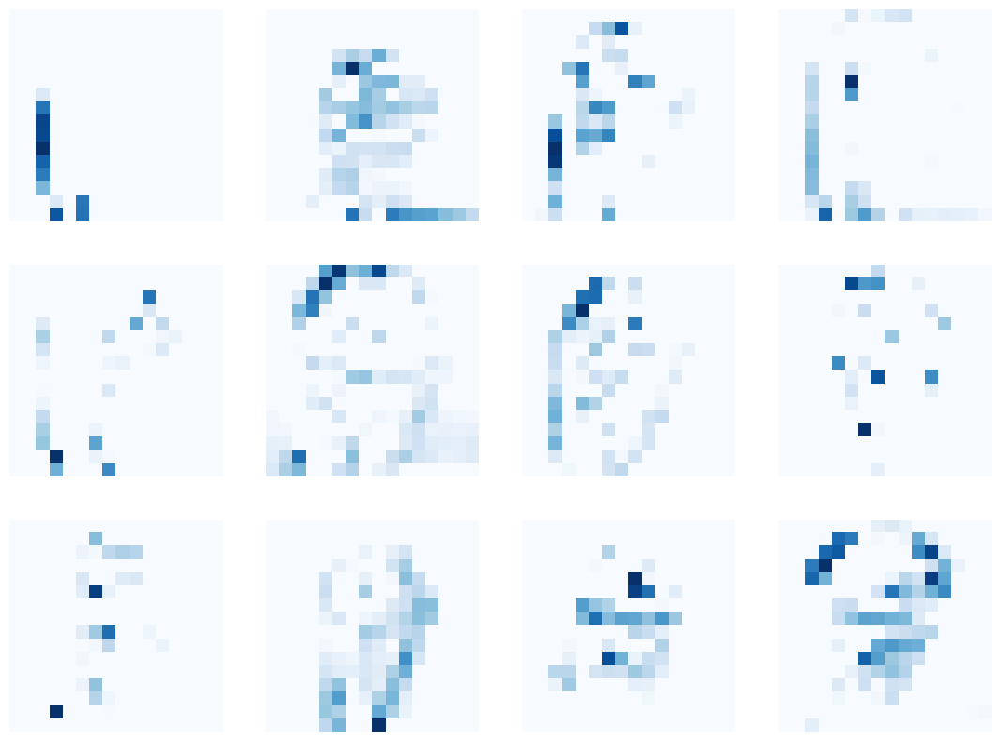

In [101]:
display_activation(activations, 4, 3, 10)

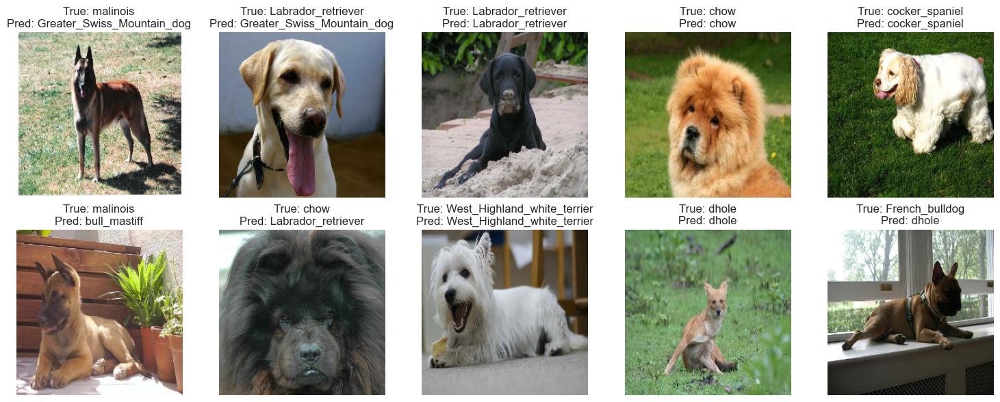

In [102]:
num_samples_to_plot = 10
num_rows = 2
num_cols = 5
class_names = [name.split('-')[1] for name in train_ds.class_names]

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6))
axes = axes.ravel()

sample_idx = 0
for x_batch, y_batch in test_ds_:
    for i in range(x_batch.shape[0]):
        if sample_idx >= num_samples_to_plot:
            break

        image = x_batch[i].numpy()
        true_label = y_batch.numpy()[i]
        true_class = class_names[np.argmax(true_label)]

        # Make prediction on a single image
        pred_label = best_model.predict(np.expand_dims(image, axis=0))
        pred_class = class_names[np.argmax(pred_label)]

        # Plot the image with true and predicted labels
        axes[sample_idx].imshow(image)
        axes[sample_idx].set_title(f"True: {true_class}\nPred: {pred_class}")
        axes[sample_idx].axis("off")

        sample_idx += 1

    if sample_idx >= num_samples_to_plot:
        break

plt.tight_layout()
plt.show()

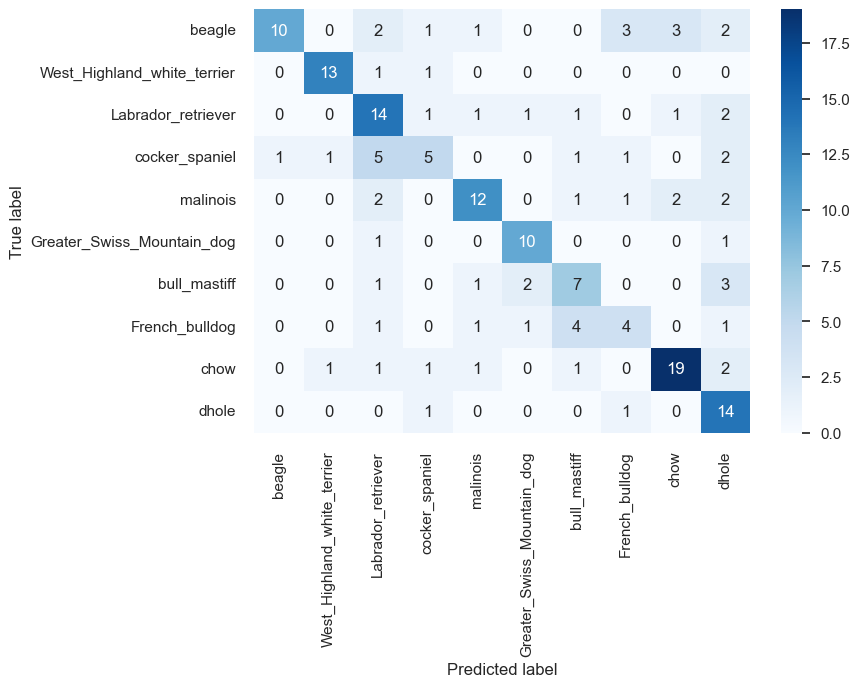

In [103]:
true_labels = []
predicted_labels = []

for x_batch, y_batch in test_ds_:
    y_true_batch = np.argmax(y_batch, axis=1)
    y_pred_batch = np.argmax(best_model.predict(x_batch), axis=1)
    
    true_labels.extend(y_true_batch.tolist())
    predicted_labels.extend(y_pred_batch.tolist())

cm = confusion_matrix(true_labels, predicted_labels)

# Create heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# Add axis labels
plt.xlabel('Predicted label')
plt.ylabel('True label')

# Show plot
plt.show()


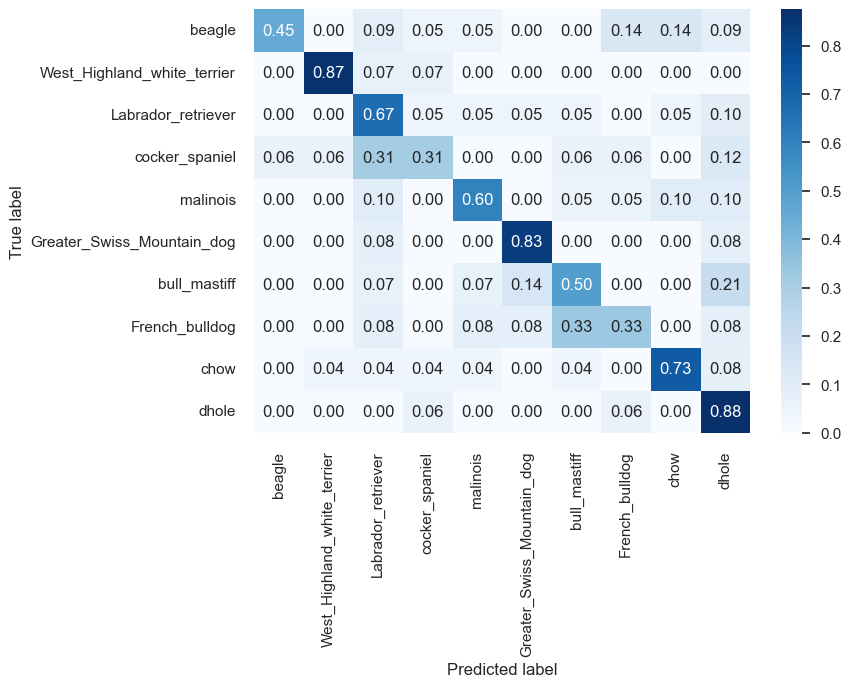

In [104]:
# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Create heatmap
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# Add axis labels
plt.xlabel('Predicted label')
plt.ylabel('True label')

# Show plot
plt.show()

In [105]:
# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=class_names))

                             precision    recall  f1-score   support

                     beagle       0.91      0.45      0.61        22
West_Highland_white_terrier       0.87      0.87      0.87        15
         Labrador_retriever       0.50      0.67      0.57        21
             cocker_spaniel       0.50      0.31      0.38        16
                   malinois       0.71      0.60      0.65        20
 Greater_Swiss_Mountain_dog       0.71      0.83      0.77        12
               bull_mastiff       0.47      0.50      0.48        14
             French_bulldog       0.40      0.33      0.36        12
                       chow       0.76      0.73      0.75        26
                      dhole       0.48      0.88      0.62        16

                   accuracy                           0.62       174
                  macro avg       0.63      0.62      0.61       174
               weighted avg       0.65      0.62      0.62       174



In [106]:
# Compute misclassification error on test dataset
loss, accuracy = best_model.evaluate(test_ds_)

# Compute misclassification error
misclassification_error = 1 - accuracy

# Print misclassification error
print('Misclassification error: {:.2f}%'.format(misclassification_error * 100))

6/6 [==============================] - 1s 66ms/step - loss: 1.7545 - categorical_accuracy: 0.6437
Misclassification error: 35.63%


In [107]:
# Création d'un tableau contenant les prédictions correctes ou incorrectes pour chaque classe
conf_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)
for i in range(len(true_labels)):
    conf_matrix[true_labels[i], predicted_labels[i]] += 1

# Calcul de l'accuracy par classe
class_acc = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)

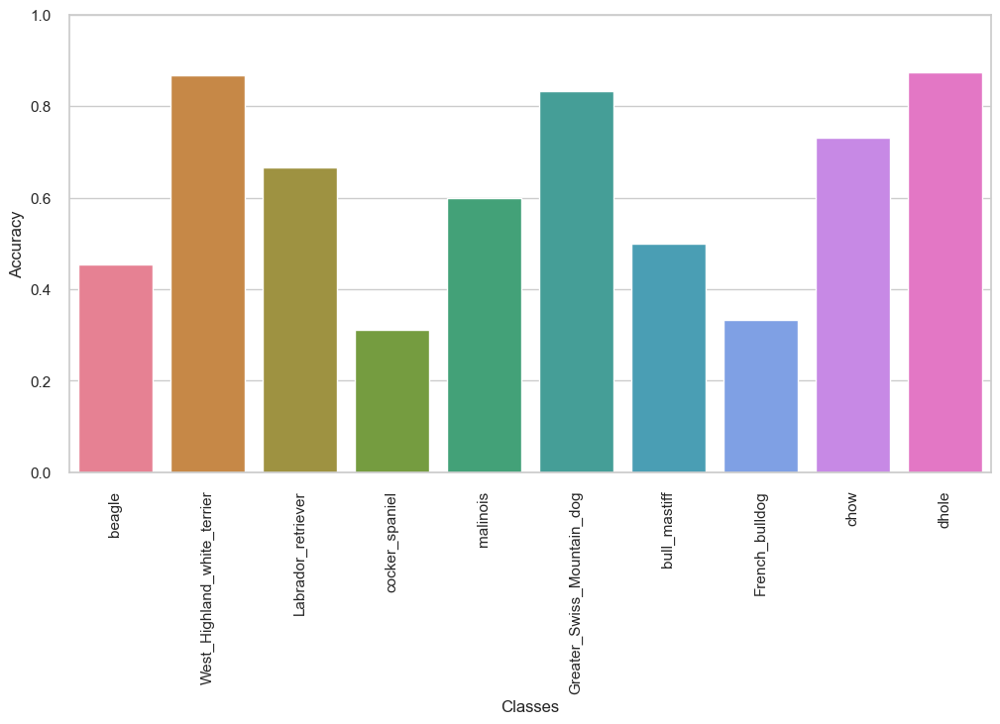

In [108]:
# Affichage de l'accuracy par classe sous forme de graphique à barres
sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=class_names, y=class_acc, palette='husl')
ax.set_xticklabels(class_names, rotation=90)
ax.set_ylim([0, 1])
ax.set_xlabel("Classes")
ax.set_ylabel("Accuracy")
plt.show()

## <font color="#114b98" id="section_5">5. Modèles avec Transfer Learning</font>

Le pricipe de du transfert learning est d'utiliser réseau déjà entraîné, en le modifiant afin de répondre à notre problématique.

Une première chose obligatoire est de réentraîner les dernières couches pour prédire les classes qui nous intéressent seulement.

Il est également possible d’adapter la structure (supprimer certaines couches, par exemple) ou de réentraîner le modèle avec un très faible learning rate pour ajuster les poids à votre problème (plus long) et optimiser les performances.

### Xception (inception modules)

In [11]:
# Chargement du modèle Xception model depuis tensorflow.keras.applications
from tensorflow.keras.applications import Xception
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [150]:
# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

In [151]:
# Remplacement de la dernière couche du modèle par des nouvelles couches
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                           

 block4_sepconv1_bn (BatchNorma  (None, 28, 28, 728)  2912       ['block4_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block4_sepconv2_act (Activatio  (None, 28, 28, 728)  0          ['block4_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 28, 28, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 28, 28, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)

 n)                                                                                               
                                                                                                  
 block7_sepconv1 (SeparableConv  (None, 14, 14, 728)  536536     ['block7_sepconv1_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 14, 14, 728)  2912       ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 14, 14, 728)  0          ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
          

 block9_sepconv3_bn (BatchNorma  (None, 14, 14, 728)  2912       ['block9_sepconv3[0][0]']        
 lization)                                                                                        
                                                                                                  
 add_19 (Add)                   (None, 14, 14, 728)  0           ['block9_sepconv3_bn[0][0]',     
                                                                  'add_18[0][0]']                 
                                                                                                  
 block10_sepconv1_act (Activati  (None, 14, 14, 728)  0          ['add_19[0][0]']                 
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 14, 14, 728)  536536     ['block10_sepconv1_act[0][0]']   
 v2D)     

                                                                                                  
 block12_sepconv3_act (Activati  (None, 14, 14, 728)  0          ['block12_sepconv2_bn[0][0]']    
 on)                                                                                              
                                                                                                  
 block12_sepconv3 (SeparableCon  (None, 14, 14, 728)  536536     ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 14, 14, 728)  2912       ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_22 (A

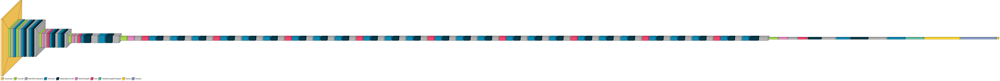

In [152]:
visualkeras.layered_view(model, legend=True,  scale_xy=3, font=font, max_z=1000, color_map=color_map)

In [153]:
# Entraînement du modèle
epochs = 25
history = model.fit(
    train_ds_,     
    epochs=epochs,
    validation_data=val_ds_
)

Epoch 1/25
42/42 [==============================] - 8s 140ms/step - loss: 0.2930 - categorical_accuracy: 0.9253 - val_loss: 0.1199 - val_categorical_accuracy: 0.9688
Epoch 2/25
42/42 [==============================] - 6s 129ms/step - loss: 0.1545 - categorical_accuracy: 0.9627 - val_loss: 0.1675 - val_categorical_accuracy: 0.9750
Epoch 3/25
42/42 [==============================] - 5s 128ms/step - loss: 0.0602 - categorical_accuracy: 0.9821 - val_loss: 0.1456 - val_categorical_accuracy: 0.9625
Epoch 4/25
42/42 [==============================] - 5s 128ms/step - loss: 0.1309 - categorical_accuracy: 0.9798 - val_loss: 0.3482 - val_categorical_accuracy: 0.9438
Epoch 5/25
42/42 [==============================] - 5s 128ms/step - loss: 0.1490 - categorical_accuracy: 0.9671 - val_loss: 0.1008 - val_categorical_accuracy: 0.9750
Epoch 6/25
42/42 [==============================] - 5s 128ms/step - loss: 0.0695 - categorical_accuracy: 0.9851 - val_loss: 0.3211 - val_categorical_accuracy: 0.9625
Epoc

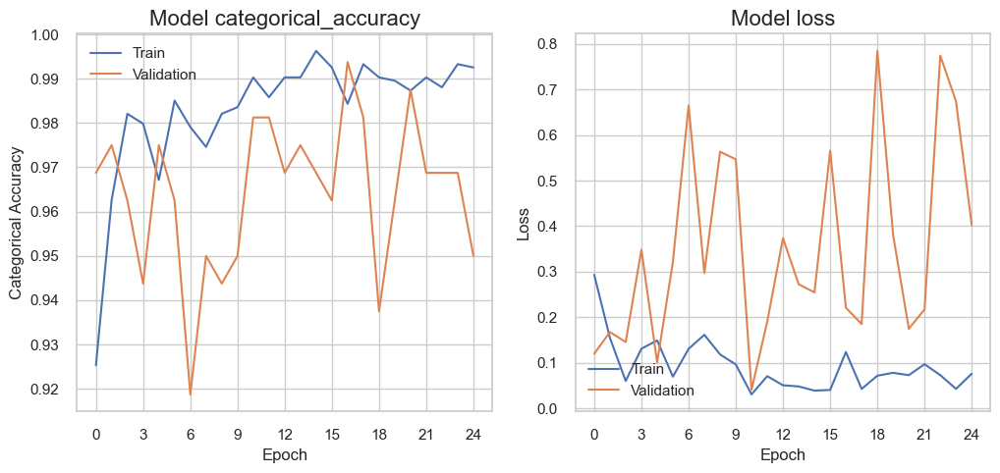

In [154]:
plot_epochs(history)

In [155]:
loss, accuracy = model.evaluate(test_ds_)
print(f'Test accuracy: {accuracy}')
pretrained_models['Xception (PreT) 100%'] = accuracy

6/6 [==============================] - 1s 72ms/step - loss: 0.3065 - categorical_accuracy: 0.9713
Test accuracy: 0.9712643623352051


### InceptionV3 (inception modules)

In [12]:
# Chargement du modèle InceptionV3 depuis tensorflow.keras.applications
from tensorflow.keras.applications import InceptionV3
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [134]:
# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

In [135]:
# Remplacement de la dernière couche du modèle par des nouvelles couches
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_203 (Conv2D)            (None, 111, 111, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_218 (Batch  (None, 111, 111, 32  96         ['conv2d_203[0][0]']             
 Normalization)                 )                                                           

 conv2d_214 (Conv2D)            (None, 25, 25, 32)   6144        ['average_pooling2d_9[0][0]']    
                                                                                                  
 batch_normalization_223 (Batch  (None, 25, 25, 64)  192         ['conv2d_208[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_225 (Batch  (None, 25, 25, 64)  192         ['conv2d_210[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_228 (Batch  (None, 25, 25, 96)  288         ['conv2d_213[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_225 (Conv2D)            (None, 25, 25, 64)   18432       ['mixed1[0][0]']                 
                                                                                                  
 batch_normalization_240 (Batch  (None, 25, 25, 64)  192         ['conv2d_225[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_116 (Activation)    (None, 25, 25, 64)   0           ['batch_normalization_240[0][0]']
                                                                                                  
 conv2d_223 (Conv2D)            (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_22

                                                                                                  
 activation_123 (Activation)    (None, 12, 12, 96)   0           ['batch_normalization_247[0][0]']
                                                                                                  
 max_pooling2d_114 (MaxPooling2  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
 D)                                                                                               
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_120[0][0]',         
                                                                  'activation_123[0][0]',         
                                                                  'max_pooling2d_114[0][0]']      
                                                                                                  
 conv2d_23

 mixed4 (Concatenate)           (None, 12, 12, 768)  0           ['activation_124[0][0]',         
                                                                  'activation_127[0][0]',         
                                                                  'activation_132[0][0]',         
                                                                  'activation_133[0][0]']         
                                                                                                  
 conv2d_247 (Conv2D)            (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_262 (Batch  (None, 12, 12, 160)  480        ['conv2d_247[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 conv2d_257 (Conv2D)            (None, 12, 12, 160)  122880      ['mixed5[0][0]']                 
                                                                                                  
 batch_normalization_272 (Batch  (None, 12, 12, 160)  480        ['conv2d_257[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_272[0][0]']
                                                                                                  
 conv2d_258 (Conv2D)            (None, 12, 12, 160)  179200      ['activation_148[0][0]']         
                                                                                                  
 batch_normalization_273 (Batch  (None, 12, 12, 160)  480        ['conv2d_258[0][0]']             
 Normaliza

 activation_158 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_282[0][0]']
                                                                                                  
 conv2d_268 (Conv2D)            (None, 12, 12, 192)  258048      ['activation_158[0][0]']         
                                                                                                  
 batch_normalization_283 (Batch  (None, 12, 12, 192)  576        ['conv2d_268[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_159 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_283[0][0]']
                                                                                                  
 conv2d_264 (Conv2D)            (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
          

 Normalization)                                                                                   
                                                                                                  
 activation_167 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_291[0][0]']
                                                                                                  
 conv2d_273 (Conv2D)            (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_277 (Conv2D)            (None, 12, 12, 192)  258048      ['activation_167[0][0]']         
                                                                                                  
 batch_normalization_288 (Batch  (None, 12, 12, 192)  576        ['conv2d_273[0][0]']             
 Normalization)                                                                                   
          

 Normalization)                                                                                   
                                                                                                  
 conv2d_287 (Conv2D)            (None, 5, 5, 192)    245760      ['average_pooling2d_16[0][0]']   
                                                                                                  
 batch_normalization_294 (Batch  (None, 5, 5, 320)   960         ['conv2d_279[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_172 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_296[0][0]']
                                                                                                  
 activation_173 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_297[0][0]']
          

                                                                                                  
 activation_181 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_305[0][0]']
                                                                                                  
 activation_182 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_306[0][0]']
                                                                                                  
 activation_185 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_309[0][0]']
                                                                                                  
 activation_186 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_310[0][0]']
                                                                                                  
 batch_normalization_311 (Batch  (None, 5, 5, 192)   576         ['conv2d_296[0][0]']             
 Normaliza

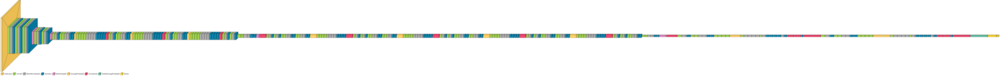

In [136]:
visualkeras.layered_view(model, legend=True,  scale_xy=3, font=font, max_z=1000, color_map=color_map)

In [137]:
# Entraînement du modèle
epochs = 20
history = model.fit(
    train_ds_,     
    epochs=epochs,
    validation_data=val_ds_
)

Epoch 1/20
42/42 [==============================] - 8s 117ms/step - loss: 0.4658 - categorical_accuracy: 0.8902 - val_loss: 0.2327 - val_categorical_accuracy: 0.9625
Epoch 2/20
42/42 [==============================] - 4s 98ms/step - loss: 0.0706 - categorical_accuracy: 0.9806 - val_loss: 0.0473 - val_categorical_accuracy: 0.9750
Epoch 3/20
42/42 [==============================] - 4s 99ms/step - loss: 0.0439 - categorical_accuracy: 0.9851 - val_loss: 0.1824 - val_categorical_accuracy: 0.9500
Epoch 4/20
42/42 [==============================] - 4s 99ms/step - loss: 0.0351 - categorical_accuracy: 0.9881 - val_loss: 0.1130 - val_categorical_accuracy: 0.9750
Epoch 5/20
42/42 [==============================] - 4s 101ms/step - loss: 0.0307 - categorical_accuracy: 0.9888 - val_loss: 0.1015 - val_categorical_accuracy: 0.9812
Epoch 6/20
42/42 [==============================] - 4s 99ms/step - loss: 0.0047 - categorical_accuracy: 0.9985 - val_loss: 0.0575 - val_categorical_accuracy: 0.9812
Epoch 7/

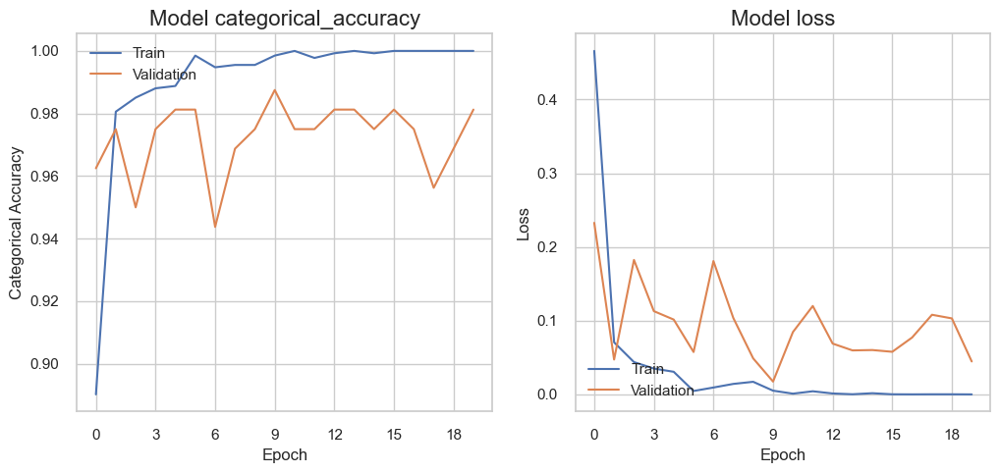

In [138]:
plot_epochs(history)

In [139]:
loss, accuracy = model.evaluate(test_ds_)
print(f'Test accuracy: {accuracy}')
pretrained_models['InceptionV3 (PreT) 100%'] = accuracy

6/6 [==============================] - 1s 47ms/step - loss: 0.0414 - categorical_accuracy: 0.9943
Test accuracy: 0.9942528605461121


In [140]:
star_model = model

### ResNet50 (residual modules)

In [141]:
# Chargement du modèle ResNet50 depuis tensorflow.keras.applications
from tensorflow.keras.applications import ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [142]:
from tensorflow.keras.applications import ResNet50V2

base_model = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [143]:
# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

In [144]:
# Remplacement de la dernière couche du modèle par des nouvelles couches
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_7[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

                                                                                                  
 conv2_block3_preact_relu (Acti  (None, 56, 56, 256)  0          ['conv2_block3_preact_bn[0][0]'] 
 vation)                                                                                          
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, 56, 56, 64)   16384       ['conv2_block3_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv2_block3_1_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_blo

                                                                                                  
 conv3_block2_2_conv (Conv2D)   (None, 28, 28, 128)  147456      ['conv3_block2_2_pad[0][0]']     
                                                                                                  
 conv3_block2_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, 28, 28, 512)  66048       ['conv3_block2_2_relu[0][0]']    
          

 vation)                                                                                          
                                                                                                  
 conv4_block1_1_conv (Conv2D)   (None, 14, 14, 256)  131072      ['conv4_block1_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv4_block1_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block1_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block1_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block1_1_bn[0][0]']      
 n)                                                                                               
          

 conv4_block3_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block3_2_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block3_3_conv (Conv2D)   (None, 14, 14, 1024  263168      ['conv4_block3_2_relu[0][0]']    
                                )                                                                 
                                                                                                  
 conv4_block3_out (Add)         (None, 14, 14, 1024  0           ['conv4_block2_out[0][0]',       
          

                                                                 ]                                
                                                                                                  
 conv4_block6_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block6_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block6_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block6_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block6_2_pad (ZeroPaddin  (None, 16, 16, 256)  0          ['conv4_block6_1_relu[0][0]']    
 g2D)                                                                                             
          

                                                                                                  
 conv5_block2_2_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block2_3_conv (Conv2D)   (None, 7, 7, 2048)   1050624     ['conv5_block2_2_relu[0][0]']    
                                                                                                  
 conv5_block2_out (Add)         (None, 7, 7, 2048)   0           ['conv5_block1_out[0][0]',       
                                                                  'conv5_block2_3_conv[0][0]']    
                                                                                                  
 conv5_block3_preact_bn (BatchN  (None, 7, 7, 2048)  8192        ['conv5_block2_out[0][0]']       
 ormalizat

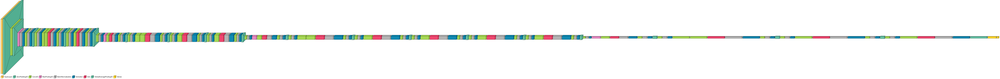

In [128]:
visualkeras.layered_view(model, legend=True,  scale_xy=3, font=font, max_z=1000, color_map=color_map)

In [145]:
# Entraînement du modèle
epochs = 25
history = model.fit(
    train_ds_,     
    epochs=epochs,
    validation_data=val_ds_
)

Epoch 1/25
42/42 [==============================] - 8s 124ms/step - loss: 0.4386 - categorical_accuracy: 0.8865 - val_loss: 0.3235 - val_categorical_accuracy: 0.9312
Epoch 2/25
42/42 [==============================] - 5s 112ms/step - loss: 0.0596 - categorical_accuracy: 0.9828 - val_loss: 0.1050 - val_categorical_accuracy: 0.9563
Epoch 3/25
42/42 [==============================] - 5s 113ms/step - loss: 0.0305 - categorical_accuracy: 0.9873 - val_loss: 0.1988 - val_categorical_accuracy: 0.9500
Epoch 4/25
42/42 [==============================] - 5s 114ms/step - loss: 0.0211 - categorical_accuracy: 0.9918 - val_loss: 0.1308 - val_categorical_accuracy: 0.9563
Epoch 5/25
42/42 [==============================] - 5s 113ms/step - loss: 0.0136 - categorical_accuracy: 0.9970 - val_loss: 0.1450 - val_categorical_accuracy: 0.9500
Epoch 6/25
42/42 [==============================] - 5s 113ms/step - loss: 0.0170 - categorical_accuracy: 0.9970 - val_loss: 0.1672 - val_categorical_accuracy: 0.9563
Epoc

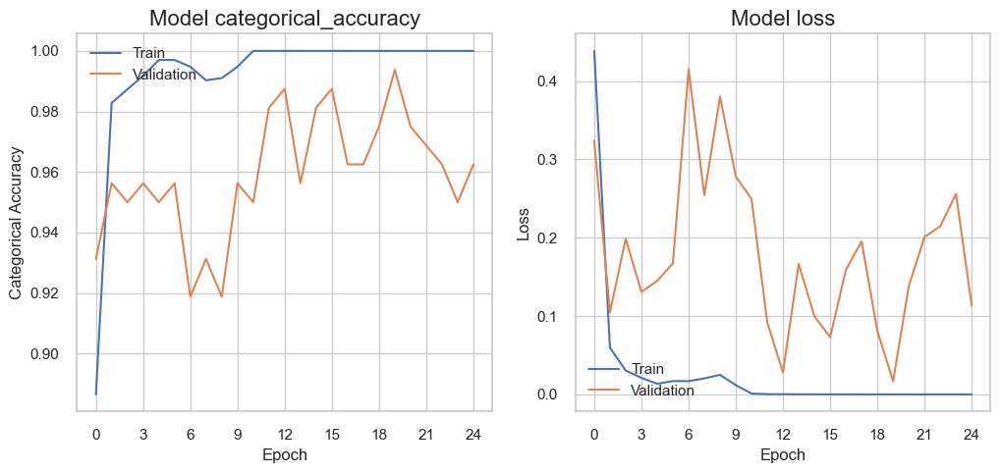

In [146]:
plot_epochs(history)

In [147]:
loss, accuracy = model.evaluate(test_ds_)
print(f'Test accuracy: {accuracy}')
pretrained_models['ResNet50 (PreT) 100%'] = accuracy

6/6 [==============================] - 1s 60ms/step - loss: 0.2340 - categorical_accuracy: 0.9655
Test accuracy: 0.9655172228813171


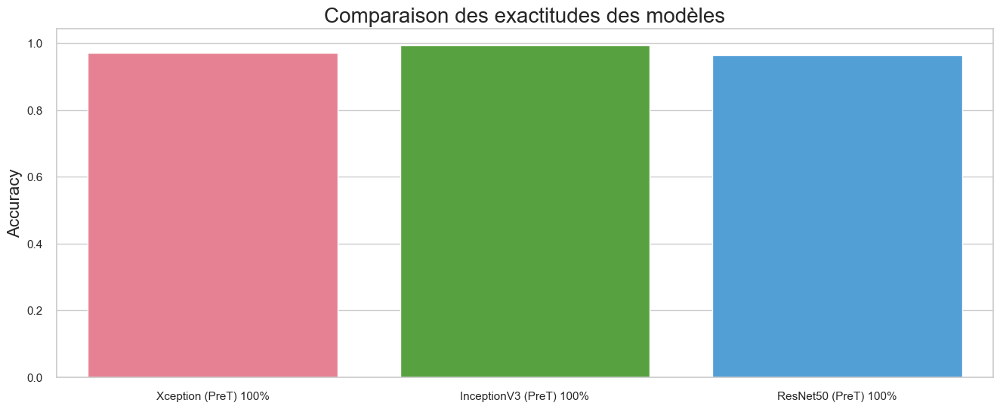

In [156]:
plt.figure(figsize=(16, 6))
sns.set(style='whitegrid')
sns.barplot(x=list(pretrained_models.keys()), y=list(pretrained_models.values()), palette='husl')
plt.ylabel('Accuracy', size=16)
plt.title('Comparaison des exactitudes des modèles', size=20)
plt.show()

## <font color="#114b98" id="section_6">6. InceptionV3 sur 10 races</font>

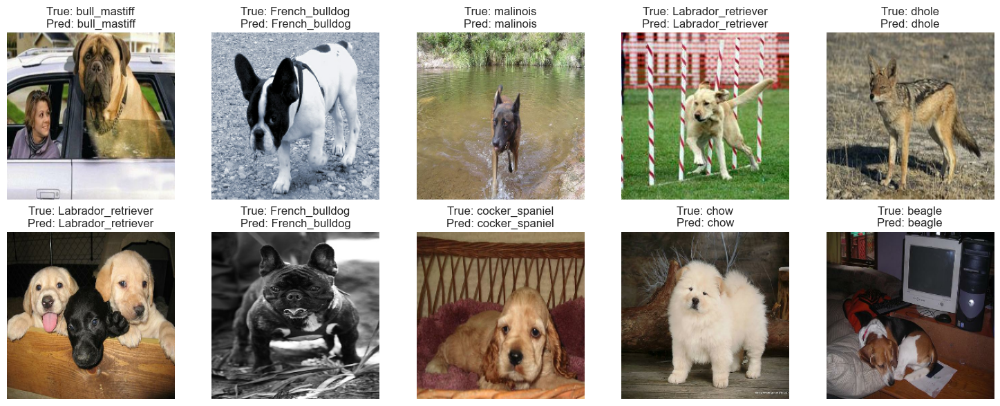

In [165]:
num_samples_to_plot = 10
num_rows = 2
num_cols = 5
class_names = [name.split('-')[1] for name in train_ds.class_names]

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6))
axes = axes.ravel()

sample_idx = 0
for x_batch, y_batch in test_ds_:
    for i in range(x_batch.shape[0]):
        if sample_idx >= num_samples_to_plot:
            break

        image = x_batch[i].numpy()
        true_label = y_batch.numpy()[i]
        true_class = class_names[np.argmax(true_label)]

        # Make prediction on a single image
        pred_label = star_model.predict(np.expand_dims(image, axis=0))
        pred_class = class_names[np.argmax(pred_label)]

        # Plot the image with true and predicted labels
        axes[sample_idx].imshow(image)
        axes[sample_idx].set_title(f"True: {true_class}\nPred: {pred_class}")
        axes[sample_idx].axis("off")

        sample_idx += 1

    if sample_idx >= num_samples_to_plot:
        break

plt.tight_layout()
plt.show()

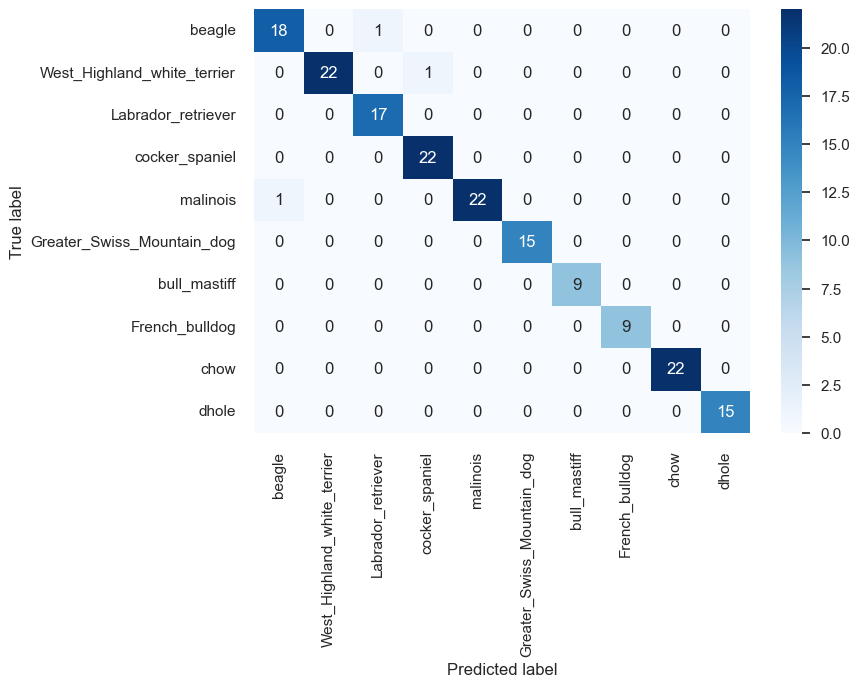

In [166]:
true_labels = []
predicted_labels = []

for x_batch, y_batch in test_ds_:
    y_true_batch = np.argmax(y_batch, axis=1)
    y_pred_batch = np.argmax(star_model.predict(x_batch), axis=1)
    
    true_labels.extend(y_true_batch.tolist())
    predicted_labels.extend(y_pred_batch.tolist())

cm = confusion_matrix(true_labels, predicted_labels)

# Create heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# Add axis labels
plt.xlabel('Predicted label')
plt.ylabel('True label')

# Show plot
plt.show()


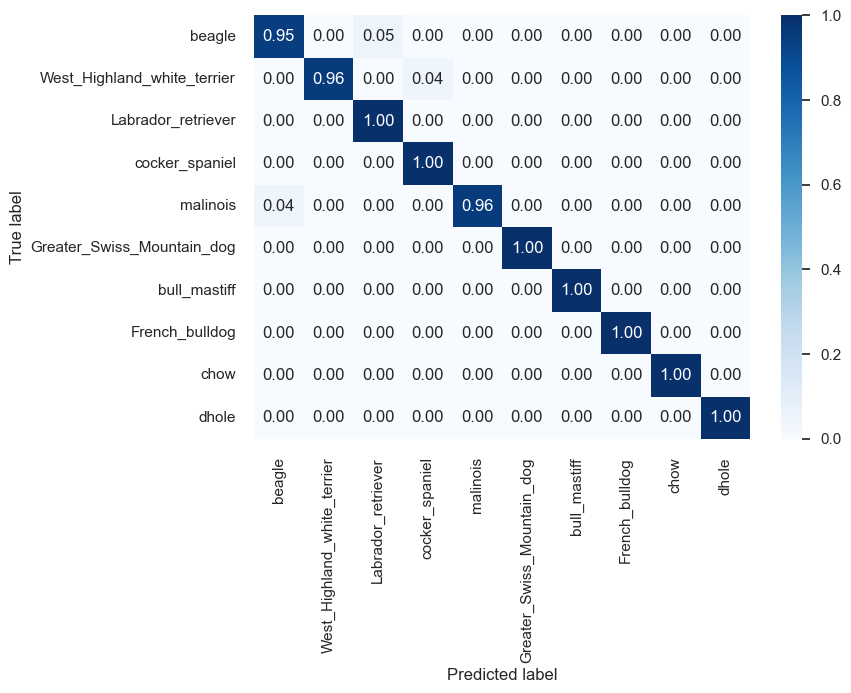

In [167]:
# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Create heatmap
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# Add axis labels
plt.xlabel('Predicted label')
plt.ylabel('True label')

# Show plot
plt.show()

In [168]:
# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=class_names))

                             precision    recall  f1-score   support

                     beagle       0.95      0.95      0.95        19
West_Highland_white_terrier       1.00      0.96      0.98        23
         Labrador_retriever       0.94      1.00      0.97        17
             cocker_spaniel       0.96      1.00      0.98        22
                   malinois       1.00      0.96      0.98        23
 Greater_Swiss_Mountain_dog       1.00      1.00      1.00        15
               bull_mastiff       1.00      1.00      1.00         9
             French_bulldog       1.00      1.00      1.00         9
                       chow       1.00      1.00      1.00        22
                      dhole       1.00      1.00      1.00        15

                   accuracy                           0.98       174
                  macro avg       0.98      0.99      0.99       174
               weighted avg       0.98      0.98      0.98       174



In [169]:
# Compute misclassification error on test dataset
loss, accuracy = star_model.evaluate(test_ds_)

# Compute misclassification error
misclassification_error = 1 - accuracy

# Print misclassification error
print('Misclassification error: {:.2f}%'.format(misclassification_error * 100))

6/6 [==============================] - 1s 48ms/step - loss: 0.1006 - categorical_accuracy: 0.9770
Misclassification error: 2.30%


In [170]:
# Création d'un tableau contenant les prédictions correctes ou incorrectes pour chaque classe
conf_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)
for i in range(len(true_labels)):
    conf_matrix[true_labels[i], predicted_labels[i]] += 1

# Calcul de l'accuracy par classe
class_acc = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)

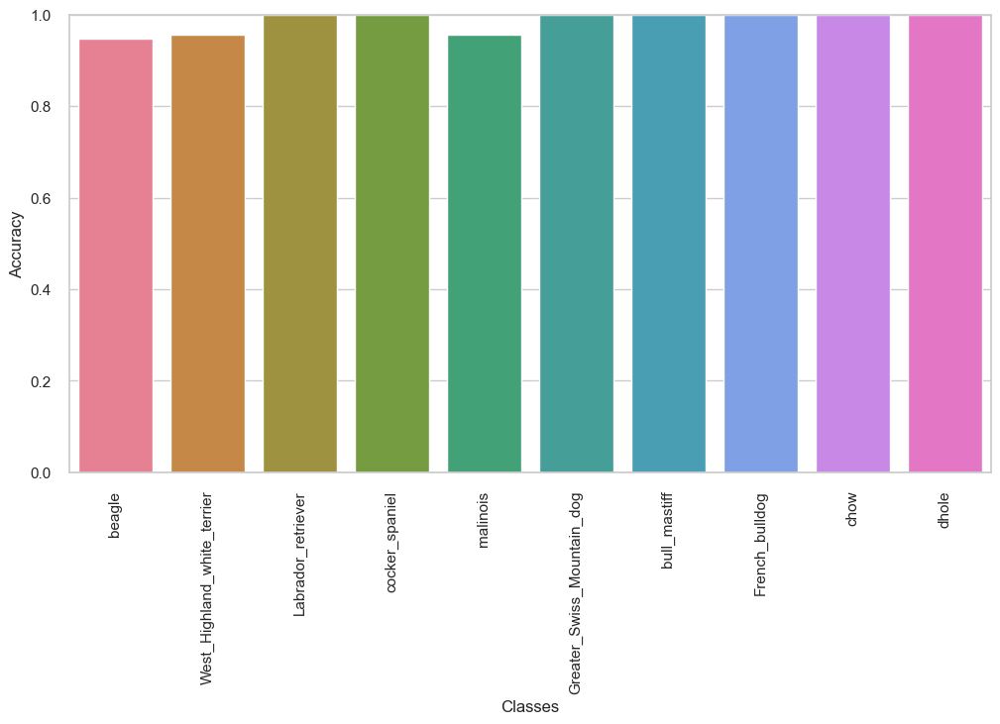

In [171]:
# Affichage de l'accuracy par classe sous forme de graphique à barres
sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=class_names, y=class_acc, palette='husl')
ax.set_xticklabels(class_names, rotation=90)
ax.set_ylim([0, 1])
ax.set_xlabel("Classes")
ax.set_ylabel("Accuracy")
plt.show()

## <font color="#114b98" id="section_7">7. InceptionV3 sur 120 races</font>

In [7]:
data_dir120 = ressources_path + '/dl/Images/'
pretrained_models120 = dict()

In [22]:
folder_names = next(os.walk(data_dir120))[1]
dog_names_code = [name.split('-')[0] for name in folder_names]
dog_names_name = [name.split('-')[1] for name in folder_names]
dog_classes_code = {i: name for i, name in enumerate(dog_names_code)}
dog_classes_name = {i: name for i, name in enumerate(dog_names_name)}
dog_classes = {code: name for code, name in zip(dog_names_code, dog_names_name)}

In [18]:
print(dog_classes_code)

{0: 'n02085620', 1: 'n02085782', 2: 'n02085936', 3: 'n02086079', 4: 'n02086240', 5: 'n02086646', 6: 'n02086910', 7: 'n02087046', 8: 'n02087394', 9: 'n02088094', 10: 'n02088238', 11: 'n02088364', 12: 'n02088466', 13: 'n02088632', 14: 'n02089078', 15: 'n02089867', 16: 'n02089973', 17: 'n02090379', 18: 'n02090622', 19: 'n02090721', 20: 'n02091032', 21: 'n02091134', 22: 'n02091244', 23: 'n02091467', 24: 'n02091635', 25: 'n02091831', 26: 'n02092002', 27: 'n02092339', 28: 'n02093256', 29: 'n02093428', 30: 'n02093647', 31: 'n02093754', 32: 'n02093859', 33: 'n02093991', 34: 'n02094114', 35: 'n02094258', 36: 'n02094433', 37: 'n02095314', 38: 'n02095570', 39: 'n02095889', 40: 'n02096051', 41: 'n02096177', 42: 'n02096294', 43: 'n02096437', 44: 'n02096585', 45: 'n02097047', 46: 'n02097130', 47: 'n02097209', 48: 'n02097298', 49: 'n02097474', 50: 'n02097658', 51: 'n02098105', 52: 'n02098286', 53: 'n02098413', 54: 'n02099267', 55: 'n02099429', 56: 'n02099601', 57: 'n02099712', 58: 'n02099849', 59: 'n

In [19]:
print(dog_classes_name)

{0: 'Chihuahua', 1: 'Japanese_spaniel', 2: 'Maltese_dog', 3: 'Pekinese', 4: 'Shih', 5: 'Blenheim_spaniel', 6: 'papillon', 7: 'toy_terrier', 8: 'Rhodesian_ridgeback', 9: 'Afghan_hound', 10: 'basset', 11: 'beagle', 12: 'bloodhound', 13: 'bluetick', 14: 'black', 15: 'Walker_hound', 16: 'English_foxhound', 17: 'redbone', 18: 'borzoi', 19: 'Irish_wolfhound', 20: 'Italian_greyhound', 21: 'whippet', 22: 'Ibizan_hound', 23: 'Norwegian_elkhound', 24: 'otterhound', 25: 'Saluki', 26: 'Scottish_deerhound', 27: 'Weimaraner', 28: 'Staffordshire_bullterrier', 29: 'American_Staffordshire_terrier', 30: 'Bedlington_terrier', 31: 'Border_terrier', 32: 'Kerry_blue_terrier', 33: 'Irish_terrier', 34: 'Norfolk_terrier', 35: 'Norwich_terrier', 36: 'Yorkshire_terrier', 37: 'wire', 38: 'Lakeland_terrier', 39: 'Sealyham_terrier', 40: 'Airedale', 41: 'cairn', 42: 'Australian_terrier', 43: 'Dandie_Dinmont', 44: 'Boston_bull', 45: 'miniature_schnauzer', 46: 'giant_schnauzer', 47: 'standard_schnauzer', 48: 'Scotch_t

In [23]:
import json

file_name = main_path + "ressources/dog_classes_code.json"
with open(file_name, 'w') as file:
    json.dump(dog_classes_code, file)
    
file_name = main_path + "ressources/dog_classes_name.json"
with open(file_name, 'w') as file:
    json.dump(dog_classes_name, file)    

file_name = main_path + "ressources/dog_classes.json"
with open(file_name, 'w') as file:
    json.dump(dog_classes, file)   

In [11]:
# Création d'une partition de 80% des images pour l'entraînement
train_ds120 = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir120,
  validation_split=0.2,
  subset='training',
  seed=420,
  image_size=img_size,
  batch_size=batch_size,
  label_mode='categorical',
  class_names=list(dog_classes.values()))

# Création d'une partition temporaire de 20% des images
temp_ds120 = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir120,
  validation_split=0.2,
  subset='validation',
  seed=420,
  image_size=img_size,
  batch_size=batch_size,
  label_mode='categorical',
  class_names=list(dog_classes.values()))

# Séparation en deux partitions égales (10%) de la partition temporaire pour la validation et les tests
val_ds120 = temp_ds120.take(len(temp_ds)//2)
test_ds120 = temp_ds120.skip(len(temp_ds)//2)

# Nombre de classes possible de classification
num_classes120 = len(train_ds120.class_names) 

train_ds120_ = train_ds120.map(preprocess_image_with_augmentation)
val_ds120_ = val_ds120.map(preprocess_image)
test_ds120_ = test_ds120.map(preprocess_image)

Found 20580 files belonging to 120 classes.
Using 16464 files for training.
Found 20580 files belonging to 120 classes.
Using 4116 files for validation.


In [12]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [13]:
print("Nombre de couches dans InceptionV3 :", len(base_model.layers))

Nombre de couches dans InceptionV3 : 311


In [192]:
#  1er essai : 100% des couches gelées

In [193]:
for layer in base_model.layers:
    layer.trainable = False

In [194]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes120, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

In [195]:
epochs = 20
history = model.fit(
    train_ds120_,     
    epochs=epochs,
    validation_data=val_ds120_,
    callbacks=[early_stopping]
)

Epoch 1/20
515/515 [==============================] - 52s 95ms/step - loss: 1.0607 - categorical_accuracy: 0.7218 - val_loss: 0.8798 - val_categorical_accuracy: 0.7750
Epoch 2/20
515/515 [==============================] - 48s 93ms/step - loss: 0.6736 - categorical_accuracy: 0.7965 - val_loss: 0.8387 - val_categorical_accuracy: 0.7750
Epoch 3/20
515/515 [==============================] - 48s 92ms/step - loss: 0.5544 - categorical_accuracy: 0.8282 - val_loss: 1.1600 - val_categorical_accuracy: 0.7063
Epoch 4/20
515/515 [==============================] - 48s 92ms/step - loss: 0.4853 - categorical_accuracy: 0.8412 - val_loss: 1.0078 - val_categorical_accuracy: 0.6938
Epoch 5/20
515/515 [==============================] - 48s 92ms/step - loss: 0.4245 - categorical_accuracy: 0.8568 - val_loss: 0.8442 - val_categorical_accuracy: 0.8125
Epoch 6/20
515/515 [==============================] - 48s 93ms/step - loss: 0.3666 - categorical_accuracy: 0.8775 - val_loss: 1.0775 - val_categorical_accuracy:

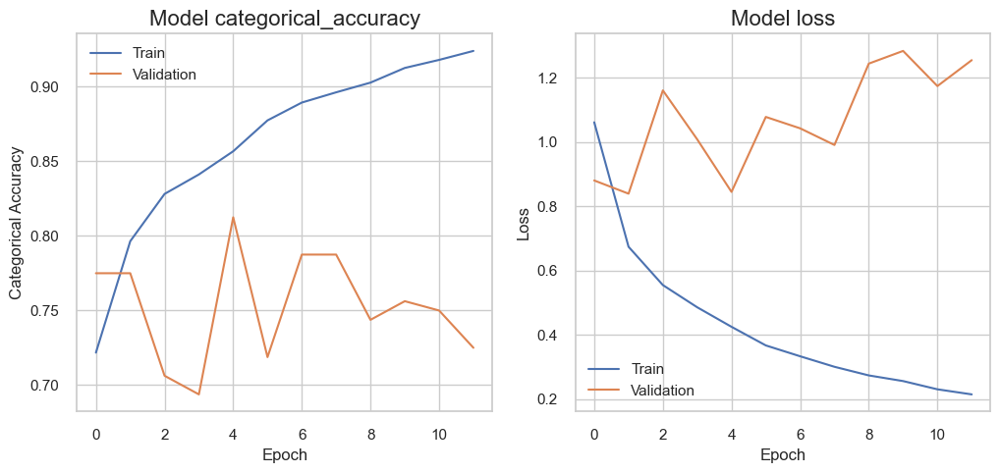

In [196]:
plot_epochs(history)

In [197]:
loss, accuracy = model.evaluate(test_ds120_)
print(f'Test accuracy: {accuracy}')
pretrained_models120['InceptionV3 (PreT) 100%'] = accuracy

124/124 [==============================] - 7s 54ms/step - loss: 0.8013 - categorical_accuracy: 0.7700
Test accuracy: 0.769969642162323


In [182]:
# 2ème essai : 
#  - Ajout d'une régularisation L2 à la couche Dense.
#  - Ajout d'une couche Dropout avant la couche Dense.
#  - Ajustement fin de certaines des couches supérieures du modèle de base.

In [198]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [199]:
for layer in base_model.layers[:-31]:
    layer.trainable = False

for layer in base_model.layers[-31:]:
    layer.trainable = True
    
# Add L2 regularization to the Dense layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)  # Add L2 regularization
x = Dropout(0.25)(x)  # Add a Dropout layer
predictions = Dense(num_classes120, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

In [200]:
epochs = 20
history = model.fit(
    train_ds120_,     
    epochs=epochs,
    validation_data=val_ds120_,
    callbacks=[early_stopping]
)

Epoch 1/20
515/515 [==============================] - 56s 103ms/step - loss: 3.4450 - categorical_accuracy: 0.6015 - val_loss: 1.5450 - val_categorical_accuracy: 0.7312
Epoch 2/20
515/515 [==============================] - 52s 101ms/step - loss: 1.4455 - categorical_accuracy: 0.7263 - val_loss: 1.4580 - val_categorical_accuracy: 0.7312
Epoch 3/20
515/515 [==============================] - 52s 101ms/step - loss: 1.2143 - categorical_accuracy: 0.7757 - val_loss: 1.5123 - val_categorical_accuracy: 0.7375
Epoch 4/20
515/515 [==============================] - 52s 100ms/step - loss: 1.0111 - categorical_accuracy: 0.8253 - val_loss: 1.5135 - val_categorical_accuracy: 0.6938
Epoch 5/20
515/515 [==============================] - 52s 100ms/step - loss: 0.9405 - categorical_accuracy: 0.8425 - val_loss: 1.4422 - val_categorical_accuracy: 0.7312
Epoch 6/20
515/515 [==============================] - 51s 100ms/step - loss: 0.8343 - categorical_accuracy: 0.8672 - val_loss: 1.4708 - val_categorical_acc

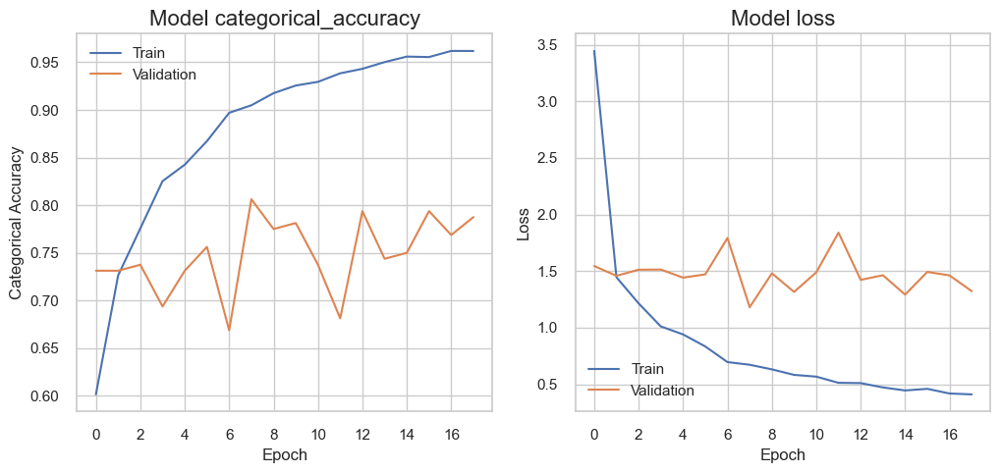

In [201]:
plot_epochs(history)

In [202]:
loss, accuracy = model.evaluate(test_ds120_)
print(f'Test accuracy: {accuracy}')
pretrained_models120['InceptionV3 (PreT) 90% + Dropout + l2'] = accuracy

124/124 [==============================] - 7s 54ms/step - loss: 1.6015 - categorical_accuracy: 0.7295
Test accuracy: 0.7295247912406921


In [ ]:
# 3ème essai : 
# - Diminution de la force de la régularisation L2 dans la couche Dense.
# - Diminution du taux de Dropout.
# - Ajustement fin de davantage de couches du modèle de base.

In [203]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [204]:
# Fine-tune more layers of the base model
for layer in base_model.layers[:-62]:  # Adjust the number based on how many layers you want to fine-tune
    layer.trainable = False

for layer in base_model.layers[-62:]:
    layer.trainable = True

# Decrease the L2 regularization strength in the Dense layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.005))(x)  # Decrease L2 regularization strength
x = Dropout(0.2)(x)  # Decrease the Dropout rate
predictions = Dense(num_classes120, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

In [205]:
epochs = 20
history = model.fit(
    train_ds120_,     
    epochs=epochs,
    validation_data=val_ds120_,
    callbacks=[early_stopping]
)

Epoch 1/20
515/515 [==============================] - 59s 108ms/step - loss: 3.2748 - categorical_accuracy: 0.5121 - val_loss: 1.7308 - val_categorical_accuracy: 0.6375
Epoch 2/20
515/515 [==============================] - 54s 106ms/step - loss: 1.4960 - categorical_accuracy: 0.6673 - val_loss: 1.9211 - val_categorical_accuracy: 0.6500
Epoch 3/20
515/515 [==============================] - 55s 106ms/step - loss: 1.2323 - categorical_accuracy: 0.7222 - val_loss: 1.6268 - val_categorical_accuracy: 0.6125
Epoch 4/20
515/515 [==============================] - 54s 105ms/step - loss: 1.0438 - categorical_accuracy: 0.7717 - val_loss: 1.6189 - val_categorical_accuracy: 0.6250
Epoch 5/20
515/515 [==============================] - 55s 106ms/step - loss: 0.9047 - categorical_accuracy: 0.8062 - val_loss: 1.5503 - val_categorical_accuracy: 0.6938
Epoch 6/20
515/515 [==============================] - 54s 105ms/step - loss: 0.8114 - categorical_accuracy: 0.8339 - val_loss: 1.6608 - val_categorical_acc

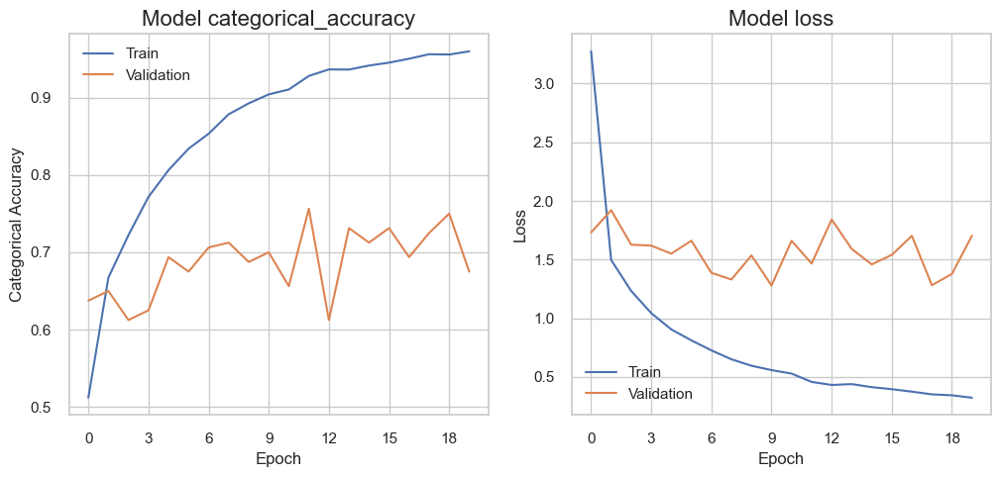

In [206]:
plot_epochs(history)

In [207]:
loss, accuracy = model.evaluate(test_ds120_)
print(f'Test accuracy: {accuracy}')
pretrained_models120['InceptionV3 (PreT) 80% + Dropout + l2'] = accuracy

124/124 [==============================] - 7s 55ms/step - loss: 1.5050 - categorical_accuracy: 0.7040
Test accuracy: 0.7039939165115356


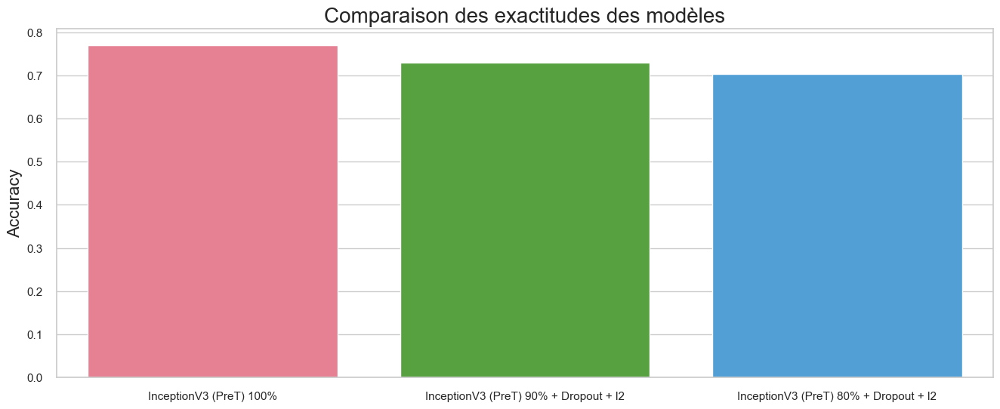

In [208]:
plt.figure(figsize=(16, 6))
sns.set(style='whitegrid')
sns.barplot(x=list(pretrained_models120.keys()), y=list(pretrained_models120.values()), palette='husl')
plt.ylabel('Accuracy', size=16)
plt.title('Comparaison des exactitudes des modèles', size=20)
plt.show()

In [ ]:
# 4ème essai : 
# - Augmentation de la force de la régularisation L2 dans la couche Dense.
# - Augmentation du taux de Dropout.
# - Retour au 90%.

In [38]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [213]:
# Fine-tune more layers of the base model
for layer in base_model.layers[:-31]:  # Adjust the number based on how many layers you want to fine-tune
    layer.trainable = False

for layer in base_model.layers[-31:]:
    layer.trainable = True

# Decrease the L2 regularization strength in the Dense layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)  # Decrease L2 regularization strength
x = Dropout(0.8)(x)  # Decrease the Dropout rate
predictions = Dense(num_classes120, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

In [214]:
epochs = 20
history = model.fit(
    train_ds120_,     
    epochs=epochs,
    validation_data=val_ds120_,
    callbacks=[early_stopping]
)

Epoch 1/20
515/515 [==============================] - 57s 104ms/step - loss: 5.2135 - categorical_accuracy: 0.4025 - val_loss: 2.2518 - val_categorical_accuracy: 0.6062
Epoch 2/20
515/515 [==============================] - 52s 102ms/step - loss: 2.4122 - categorical_accuracy: 0.5936 - val_loss: 1.7560 - val_categorical_accuracy: 0.7250
Epoch 3/20
515/515 [==============================] - 52s 101ms/step - loss: 2.0389 - categorical_accuracy: 0.6620 - val_loss: 1.9221 - val_categorical_accuracy: 0.7563
Epoch 4/20
515/515 [==============================] - 52s 102ms/step - loss: 1.8077 - categorical_accuracy: 0.7167 - val_loss: 1.6437 - val_categorical_accuracy: 0.7563
Epoch 5/20
515/515 [==============================] - 53s 102ms/step - loss: 1.5927 - categorical_accuracy: 0.7592 - val_loss: 1.5717 - val_categorical_accuracy: 0.7875
Epoch 6/20
515/515 [==============================] - 52s 101ms/step - loss: 1.4822 - categorical_accuracy: 0.7856 - val_loss: 1.5621 - val_categorical_acc

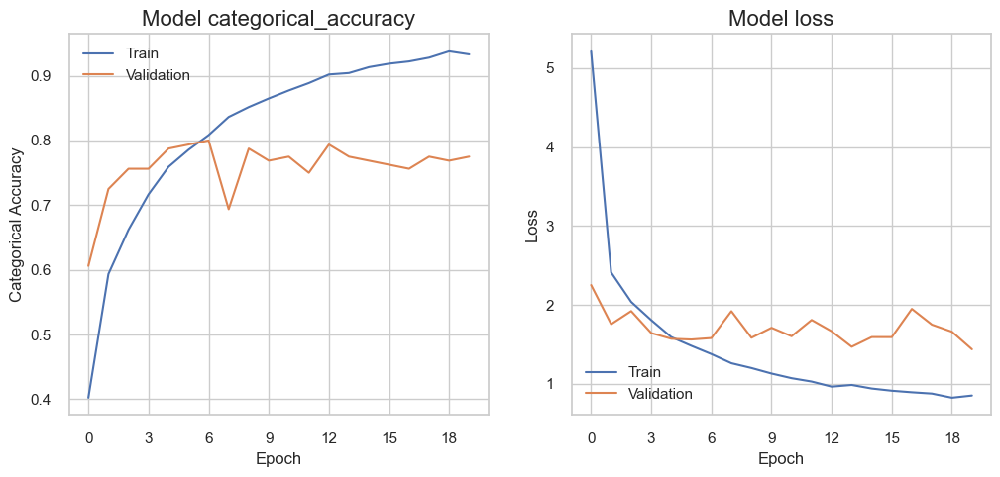

In [215]:
plot_epochs(history)

In [216]:
loss, accuracy = model.evaluate(test_ds120_)
print(f'Test accuracy: {accuracy}')
pretrained_models120['InceptionV3 (PreT) 90% + Dropout(0.8) + l2(0.01)'] = accuracy

124/124 [==============================] - 7s 57ms/step - loss: 1.8040 - categorical_accuracy: 0.7492
Test accuracy: 0.7492416501045227


In [ ]:
# 5ème essai : 
# - Régularisation l1_L2 dans la couche Dense.
# - Diminutition du taux de Dropout.
# - Retour au 90%.

In [217]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [218]:
# Fine-tune more layers of the base model
for layer in base_model.layers[:-31]:  # Adjust the number based on how many layers you want to fine-tune
    layer.trainable = False

for layer in base_model.layers[-31:]:
    layer.trainable = True
    
from tensorflow.keras.regularizers import l1_l2

# Decrease the L2 regularization strength in the Dense layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4))(x)
x = Dropout(0.5)(x)  # Decrease the Dropout rate
predictions = Dense(num_classes120, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

In [219]:
epochs = 20
history = model.fit(
    train_ds120_,     
    epochs=epochs,
    validation_data=val_ds120_,
    callbacks=[early_stopping]
)

Epoch 1/20
515/515 [==============================] - 56s 103ms/step - loss: 2.0910 - categorical_accuracy: 0.5926 - val_loss: 1.6135 - val_categorical_accuracy: 0.7000
Epoch 2/20
515/515 [==============================] - 52s 101ms/step - loss: 1.3407 - categorical_accuracy: 0.7321 - val_loss: 1.2173 - val_categorical_accuracy: 0.7937
Epoch 3/20
515/515 [==============================] - 52s 100ms/step - loss: 1.0862 - categorical_accuracy: 0.7865 - val_loss: 1.1191 - val_categorical_accuracy: 0.7625
Epoch 4/20
515/515 [==============================] - 52s 101ms/step - loss: 0.9121 - categorical_accuracy: 0.8261 - val_loss: 1.2702 - val_categorical_accuracy: 0.7500
Epoch 5/20
515/515 [==============================] - 52s 101ms/step - loss: 0.7972 - categorical_accuracy: 0.8547 - val_loss: 1.4011 - val_categorical_accuracy: 0.7625
Epoch 6/20
515/515 [==============================] - 52s 101ms/step - loss: 0.7076 - categorical_accuracy: 0.8748 - val_loss: 1.4667 - val_categorical_acc

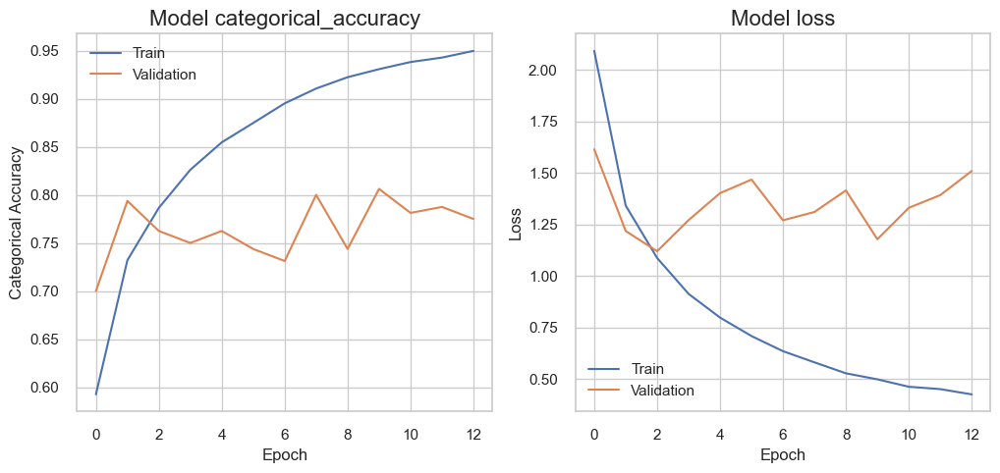

In [220]:
plot_epochs(history)

In [221]:
loss, accuracy = model.evaluate(test_ds120_)
print(f'Test accuracy: {accuracy}')
pretrained_models120['InceptionV3 (PreT) 90% + Dropout(0.5) + l1_l2'] = accuracy

124/124 [==============================] - 7s 56ms/step - loss: 1.3200 - categorical_accuracy: 0.7394
Test accuracy: 0.7393832206726074


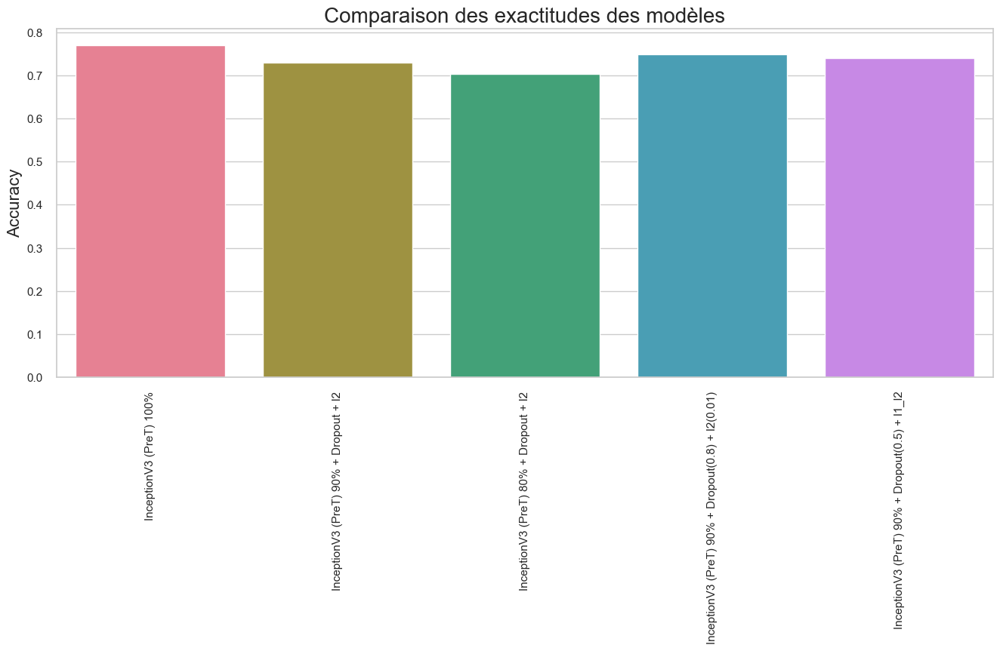

In [238]:
plt.figure(figsize=(16, 6))
sns.set(style='whitegrid')
sns.barplot(x=list(pretrained_models120.keys()), y=list(pretrained_models120.values()), palette='husl')
plt.ylabel('Accuracy', size=16)
plt.title('Comparaison des exactitudes des modèles', size=20)
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.show()

In [27]:
# Je viens d'apprendre que je peux en fait utiliser les modèle de base une fois pour 
# ensuite entraîner uniquement les dernières couches, ce qui va me faire gagner du temps.

In [17]:
# Extraire les caractéristiques du modèle de base (InceptionV3) avec les couches gelées :
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = True

feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

In [18]:
train_features = []
train_labels = []

for images, labels in train_ds120_:
    features = base_model(images)
    train_features.extend(features.numpy())
    train_labels.extend(labels.numpy())

train_features = np.array(train_features)
train_labels = np.array(train_labels)

val_features = []
val_labels = []

for images, labels in val_ds120_:
    features = base_model(images)
    val_features.extend(features.numpy())
    val_labels.extend(labels.numpy())

val_features = np.array(val_features)
val_labels = np.array(val_labels)

test_features = []
test_labels = []

for images, labels in test_ds120_:
    features = base_model(images)
    test_features.extend(features.numpy())
    test_labels.extend(labels.numpy())

test_features = np.array(test_features)
test_labels = np.array(test_labels)

In [ ]:
# Ajout de paramètres supplémentaires pour la data augmentation
def preprocess_image_with_augmentation(image, label, img_size=(224, 224)):
    image = tf.image.resize(image, img_size)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_hue(image, max_delta=0.1)
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_saturation(image, lower=0.9, upper=1.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

In [2]:
input_shape = base_model.output_shape[1:]
inputs = Input(shape=input_shape)
x = GlobalAveragePooling2D()(inputs)
x = Dense(2048, activation='relu', kernel_regularizer=l2(0.005))(x)
x = Dropout(0.05)(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.1)(x)
predictions = Dense(num_classes120, activation='softmax')(x)

model_120 = Model(inputs=inputs, outputs=predictions)

model_120.compile(
    optimizer=Adam(lr=0.000005),
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

epochs = 50
history = model_120.fit(
    train_features, train_labels,
    epochs=epochs,
    validation_data=(val_features, val_labels),
    callbacks=[early_stopping]
)

Epoch 1/50
515/515 [==============================] - 4s 6ms/step - loss: 27.5301 - categorical_accuracy: 0.2382 - val_loss: 26.1884 - val_categorical_accuracy: 0.5500
Epoch 2/50
515/515 [==============================] - 3s 6ms/step - loss: 24.7963 - categorical_accuracy: 0.6630 - val_loss: 23.6568 - val_categorical_accuracy: 0.7500
Epoch 3/50
515/515 [==============================] - 3s 6ms/step - loss: 22.8941 - categorical_accuracy: 0.7567 - val_loss: 22.2996 - val_categorical_accuracy: 0.7812
Epoch 4/50
515/515 [==============================] - 3s 6ms/step - loss: 21.7985 - categorical_accuracy: 0.7848 - val_loss: 21.3937 - val_categorical_accuracy: 0.7937
Epoch 5/50
515/515 [==============================] - 3s 6ms/step - loss: 20.9616 - categorical_accuracy: 0.7942 - val_loss: 20.6309 - val_categorical_accuracy: 0.8125
Epoch 6/50
515/515 [==============================] - 3s 6ms/step - loss: 20.2114 - categorical_accuracy: 0.8024 - val_loss: 19.9210 - val_categorical_accuracy:

Epoch 50/50
515/515 [==============================] - 3s 6ms/step - loss: 4.9579 - categorical_accuracy: 0.8802 - val_loss: 5.0858 - val_categorical_accuracy: 0.8438


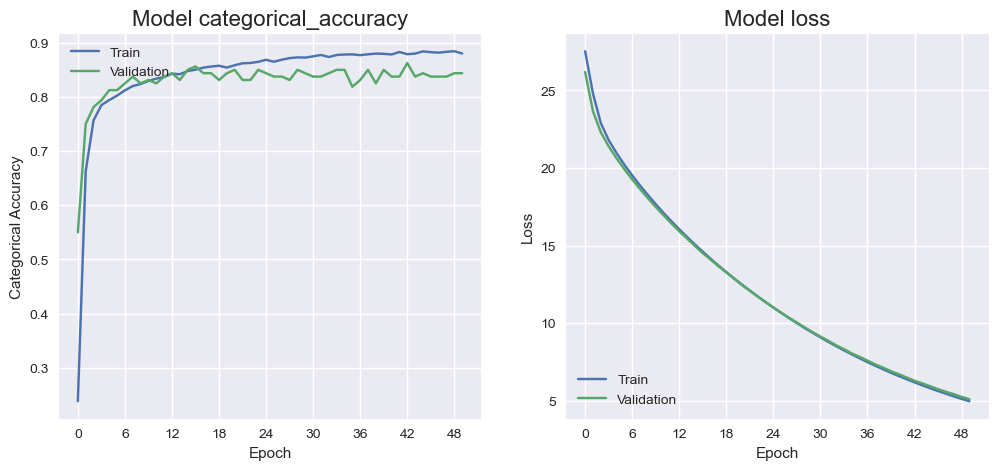

In [5]:
plot_epochs(history)

In [6]:
loss, accuracy = model_120.evaluate(test_features, test_labels, verbose=0)
print(f'Test accuracy: {accuracy}')

Test accuracy: 0.8131951689720154


Nous avons bien réussi à augmenter la performance de notre modèle en passant de 0.77 à 0.81 en accuracy.

In [2]:
# Modèle final
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(2048, activation='relu', kernel_regularizer=l2(0.005))(x)
x = Dropout(0.05)(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.1)(x)
predictions = Dense(num_classes120, activation='softmax')(x)

model_120 = Model(inputs=base_model.inputs, outputs=predictions)

model_120.compile(
    optimizer=Adam(lr=0.000005),
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

epochs = 50
history = model_120.fit(
    train_ds120_,     
    epochs=epochs,
    validation_data=val_ds120_,
    callbacks=[early_stopping]
)

Epoch 1/50
515/515 [==============================] - 120s 215ms/step - loss: 27.5791 - categorical_accuracy: 0.1211 - val_loss: 26.1289 - val_categorical_accuracy: 0.3938
Epoch 2/50
515/515 [==============================] - 110s 213ms/step - loss: 24.8453 - categorical_accuracy: 0.4567 - val_loss: 23.0017 - val_categorical_accuracy: 0.6687
Epoch 3/50
515/515 [==============================] - 110s 213ms/step - loss: 22.3481 - categorical_accuracy: 0.6499 - val_loss: 21.1719 - val_categorical_accuracy: 0.7563
Epoch 4/50
515/515 [==============================] - 109s 212ms/step - loss: 20.7624 - categorical_accuracy: 0.7217 - val_loss: 19.9540 - val_categorical_accuracy: 0.7812
Epoch 5/50
515/515 [==============================] - 109s 211ms/step - loss: 19.6501 - categorical_accuracy: 0.7606 - val_loss: 18.9455 - val_categorical_accuracy: 0.8062
Epoch 6/50
515/515 [==============================] - 110s 214ms/step - loss: 18.6998 - categorical_accuracy: 0.7889 - val_loss: 18.1252 - v

Epoch 49/50
515/515 [==============================] - 110s 213ms/step - loss: 0.8589 - categorical_accuracy: 0.9968 - val_loss: 1.4232 - val_categorical_accuracy: 0.8125
Epoch 50/50
515/515 [==============================] - 109s 212ms/step - loss: 0.8027 - categorical_accuracy: 0.9968 - val_loss: 1.3436 - val_categorical_accuracy: 0.7937


In [5]:
loss, accuracy = model_120.evaluate(test_ds120_)
print(f'Test accuracy: {accuracy}')

124/124 [==============================] - 8s 61ms/step - loss: 1.4525 - categorical_accuracy: 0.8046
Test accuracy: 0.8046005964279175


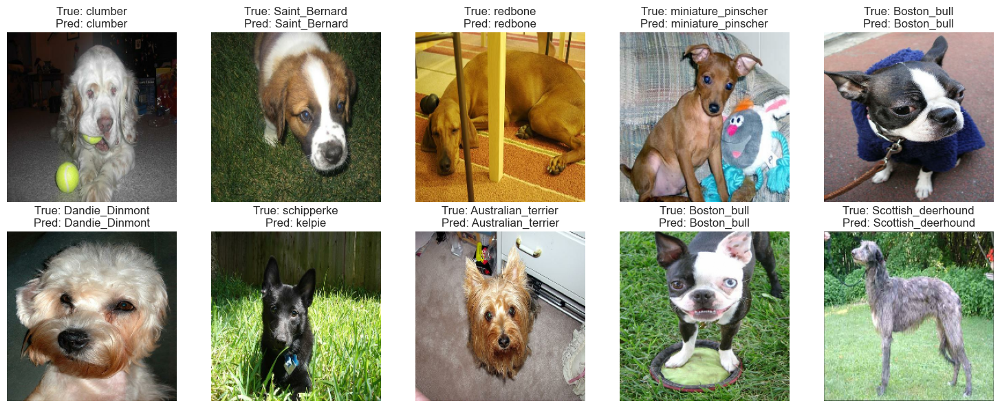

In [6]:
num_samples_to_plot = 10
num_rows = 2
num_cols = 5
class_names = [name.split('-')[1] for name in train_ds120.class_names]

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6))
axes = axes.ravel()

sample_idx = 0
for x_batch, y_batch in test_ds120_:
    for i in range(x_batch.shape[0]):
        if sample_idx >= num_samples_to_plot:
            break

        image = x_batch[i].numpy()
        true_label = y_batch.numpy()[i]
        true_class = class_names[np.argmax(true_label)]

        # Make prediction on a single image
        pred_label = model_120.predict(np.expand_dims(image, axis=0))
        pred_class = class_names[np.argmax(pred_label)]

        # Plot the image with true and predicted labels
        axes[sample_idx].imshow(image)
        axes[sample_idx].set_title(f"True: {true_class}\nPred: {pred_class}")
        axes[sample_idx].axis("off")

        sample_idx += 1

    if sample_idx >= num_samples_to_plot:
        break

plt.tight_layout()
plt.show()

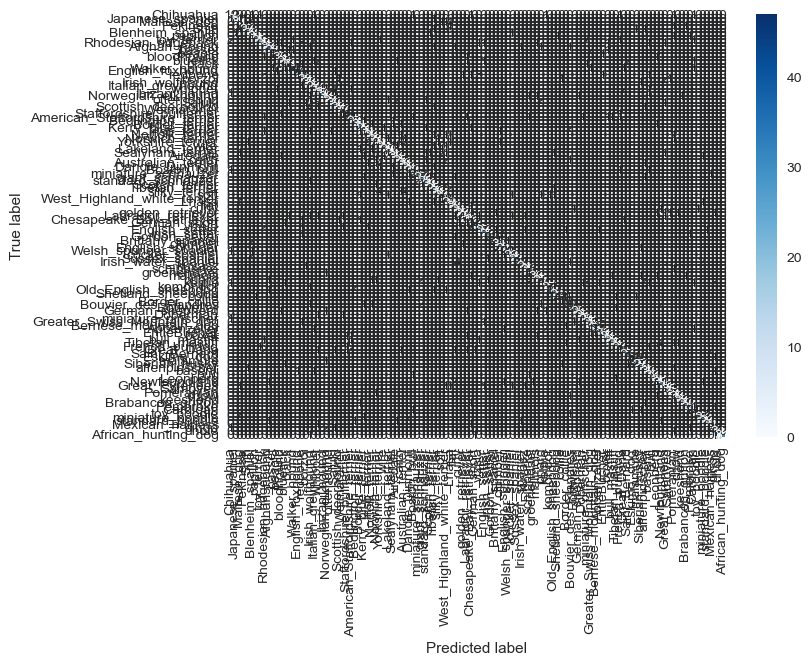

In [8]:
true_labels = []
predicted_labels = []

for x_batch, y_batch in test_ds120_:
    y_true_batch = np.argmax(y_batch, axis=1)
    y_pred_batch = np.argmax(model_120.predict(x_batch), axis=1)
    
    true_labels.extend(y_true_batch.tolist())
    predicted_labels.extend(y_pred_batch.tolist())

cm = confusion_matrix(true_labels, predicted_labels)

# Create heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# Add axis labels
plt.xlabel('Predicted label')
plt.ylabel('True label')

# Show plot
plt.show()

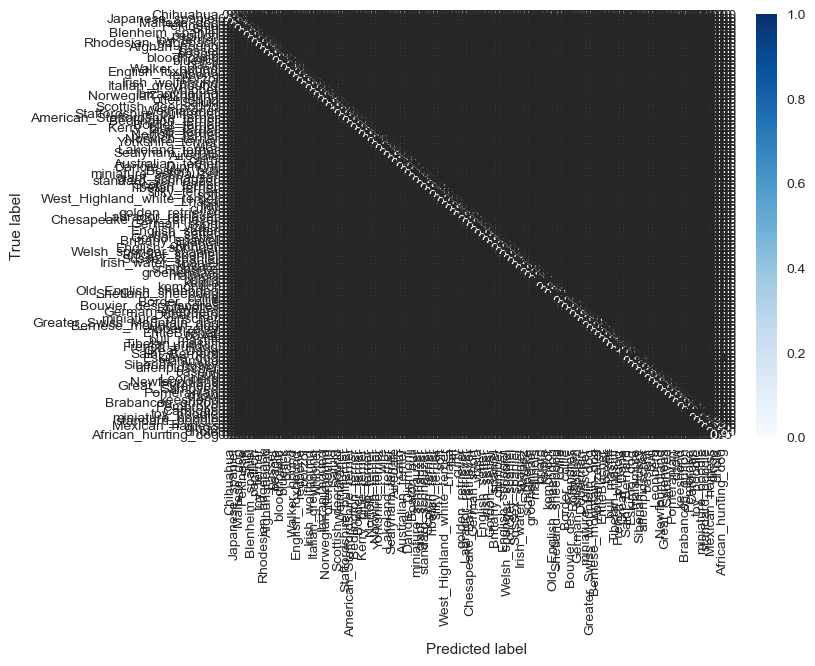

In [9]:
# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Create heatmap
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# Add axis labels
plt.xlabel('Predicted label')
plt.ylabel('True label')

# Show plot
plt.show()

In [10]:
# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=class_names))

                                precision    recall  f1-score   support

                     Chihuahua       0.68      0.68      0.68        28
              Japanese_spaniel       0.89      0.84      0.86        37
                   Maltese_dog       0.77      0.85      0.81        40
                      Pekinese       0.95      0.78      0.86        27
                          Shih       0.66      0.73      0.69        37
              Blenheim_spaniel       0.77      0.91      0.83        33
                      papillon       0.97      0.82      0.89        38
                   toy_terrier       0.93      0.62      0.75        40
           Rhodesian_ridgeback       0.68      0.66      0.67        35
                  Afghan_hound       0.90      0.86      0.88        43
                        basset       0.93      0.79      0.85        33
                        beagle       0.76      0.81      0.79        27
                    bloodhound       0.90      0.88      0.89  

In [11]:
# Compute misclassification error on test dataset
loss, accuracy = model_120.evaluate(test_ds120_)

# Compute misclassification error
misclassification_error = 1 - accuracy

# Print misclassification error
print('Misclassification error: {:.2f}%'.format(misclassification_error * 100))

124/124 [==============================] - 8s 54ms/step - loss: 1.4514 - categorical_accuracy: 0.8054
Misclassification error: 19.46%


In [14]:
# Création d'un tableau contenant les prédictions correctes ou incorrectes pour chaque classe
conf_matrix = np.zeros((num_classes120, num_classes120), dtype=np.int32)
for i in range(len(true_labels)):
    conf_matrix[true_labels[i], predicted_labels[i]] += 1

# Calcul de l'accuracy par classe
class_acc = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)

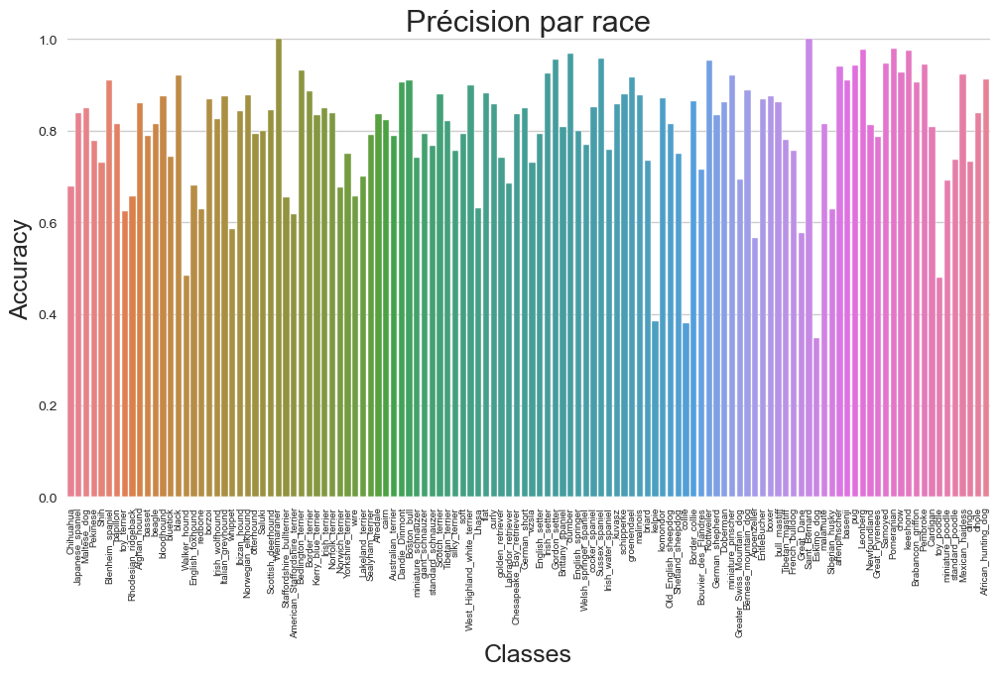

In [35]:
# Affichage de l'accuracy par classe sous forme de graphique à barres
sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=class_names, y=class_acc, palette='husl')
ax.set_xticklabels(class_names, rotation=90, size=7)
ax.set_ylim([0, 1])
ax.set_title('Précision par race', size = 22)
ax.set_xlabel("Classes", size= 18)
ax.set_ylabel("Accuracy", size= 18)
plt.show()

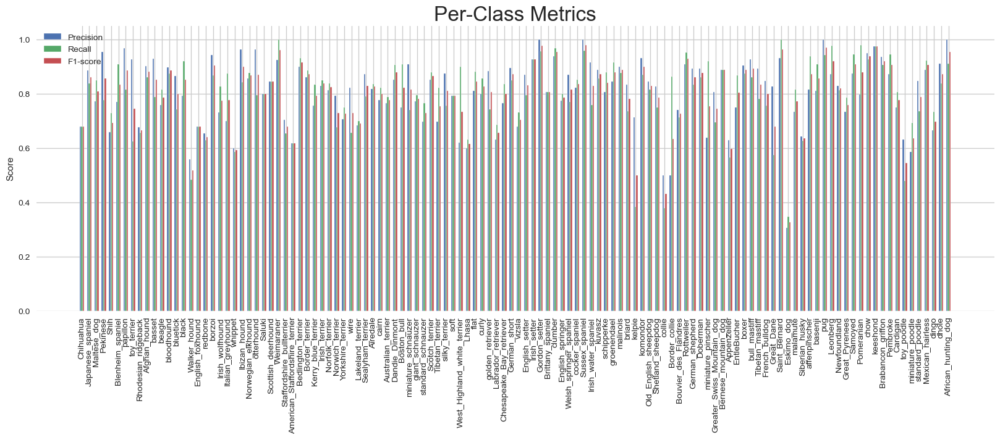

In [19]:
from sklearn.metrics import precision_recall_fscore_support

# Calculate per-class metrics
precision, recall, f1, _ = precision_recall_fscore_support(true_labels, predicted_labels)

# Create bar chart
x = np.arange(len(class_names))
width = 0.2

fig, ax = plt.subplots(figsize=(20, 6))
ax.bar(x - width, precision, width, label='Precision')
ax.bar(x, recall, width, label='Recall')
ax.bar(x + width, f1, width, label='F1-score')

# Add axis labels and ticks
ax.set_ylabel('Score')
ax.set_title('Per-Class Metrics', size = 24)
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=90)
ax.legend()

# Show plot
plt.show()

In [25]:
import pandas as pd

# Create a DataFrame with breed names and their corresponding F1-scores
breed_metrics = pd.DataFrame({'Breed': class_names, 'F1-score': f1})

# Sort breeds by F1-score
breed_metrics = breed_metrics.sort_values(by='F1-score', ascending=False)

# Extract top 10 and worst 10 breeds
top_10_breeds = breed_metrics.head(10)
worst_10_breeds = breed_metrics.tail(10)

# Create bar charts for top 10 and worst 10 breeds
def plot_breeds(data, title):
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.bar(data['Breed'], data['F1-score'])
    ax.set_ylabel('F1-score')
    ax.set_title(title)
    plt.xticks(rotation=45)
    plt.show()


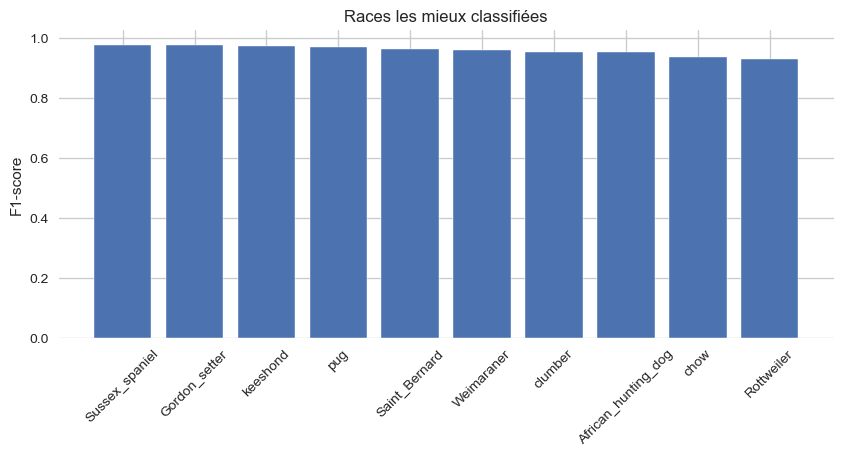

In [28]:
plot_breeds(top_10_breeds, 'Races les mieux classifiées')

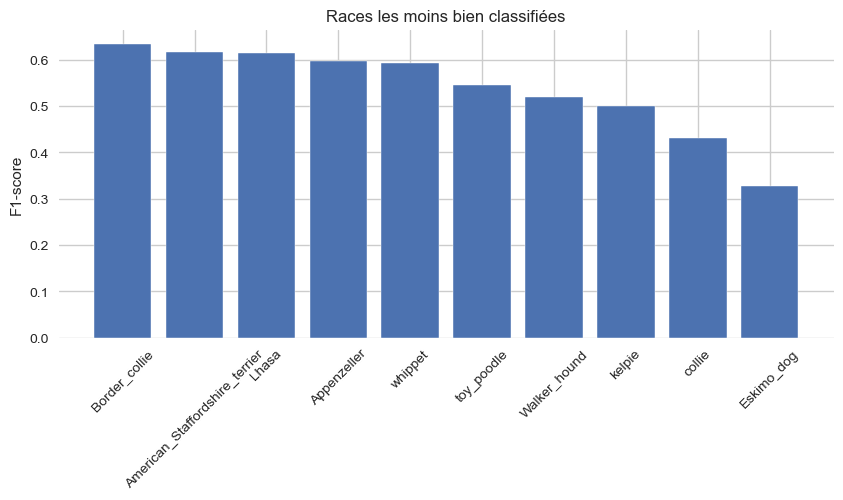

In [29]:
plot_breeds(worst_10_breeds, 'Races les moins bien classifiées')

In [30]:
# Find the indices of the misclassified breeds
misclassified_indices = np.where(np.array(true_labels) != np.array(predicted_labels))

# Extract the corresponding true and predicted labels for misclassified breeds
misclassified_true_labels = np.array(true_labels)[misclassified_indices]
misclassified_predicted_labels = np.array(predicted_labels)[misclassified_indices]

# Create a DataFrame with the misclassified breeds and their counts
misclassified_breeds = pd.DataFrame({'True Label': misclassified_true_labels, 'Predicted Label': misclassified_predicted_labels})
misclassification_counts = misclassified_breeds.groupby(['True Label', 'Predicted Label']).size().reset_index(name='Count')

# Sort the misclassification counts in descending order
misclassification_counts = misclassification_counts.sort_values(by='Count', ascending=False)

# Display the top misclassified breeds
num_misclassifications_to_display = 10
top_misclassifications = misclassification_counts.head(num_misclassifications_to_display)

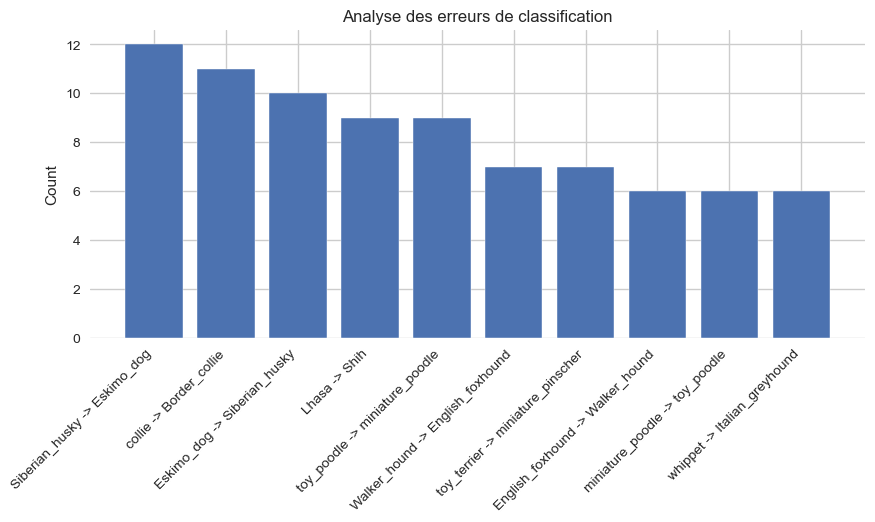

In [32]:
fig, ax = plt.subplots(figsize=(10, 4))
ax.bar(range(num_misclassifications_to_display), top_misclassifications['Count'])
ax.set_xticks(range(num_misclassifications_to_display))
ax.set_xticklabels([f"{class_names[int(row['True Label'])]} -> {class_names[int(row['Predicted Label'])]}" for _, row in top_misclassifications.iterrows()], rotation=45, ha='right')
ax.set_ylabel('Count')
ax.set_title('Analyse des erreurs de classification')
plt.show()

Je vais maintenant sauvegarder ce modèle.

In [23]:
# Sauvegarde du meilleur modèle
best_model = main_path + "ressources/model_120.h5"  
model_120.save(best_model) 

Found 1673 files belonging to 10 classes.
Using 1339 files for training.
Found 1673 files belonging to 10 classes.
Using 334 files for validation.
Found 20580 files belonging to 120 classes.
Using 16464 files for training.
Found 20580 files belonging to 120 classes.
Using 4116 files for validation.
